## Importing Necessory Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
pd.set_option('display.max_columns', None)

## Loading the data

In [3]:
ls

analysis.ipynb       correlation_heatmap.png
analysis.md          credit_churn_EDA.ipynb
analysis.text        df_dummies_no_dropped.csv
churn_original.csv   Model_building.ipynb
correlation_bar.png  Model_building_template_classification.ipynb


In [4]:
original_df = pd.read_csv("churn_original.csv")

In [5]:
df = original_df.copy()

# EDA

### Proprocessing

In [6]:
# first 5 data
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [7]:
# droping customer id column
df.drop(["customerID"], axis=1, inplace=True)

In [8]:
# total size of the data set
print("Number of Rows in data: ", df.shape[0])
print("Number of columns in data: ", df.shape[1])

Number of Rows in data:  7043
Number of columns in data:  20


In [9]:
# checking basic info about dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7043 non-null   object 
 1   SeniorCitizen     7043 non-null   int64  
 2   Partner           7043 non-null   object 
 3   Dependents        7043 non-null   object 
 4   tenure            7043 non-null   int64  
 5   PhoneService      7043 non-null   object 
 6   MultipleLines     7043 non-null   object 
 7   InternetService   7043 non-null   object 
 8   OnlineSecurity    7043 non-null   object 
 9   OnlineBackup      7043 non-null   object 
 10  DeviceProtection  7043 non-null   object 
 11  TechSupport       7043 non-null   object 
 12  StreamingTV       7043 non-null   object 
 13  StreamingMovies   7043 non-null   object 
 14  Contract          7043 non-null   object 
 15  PaperlessBilling  7043 non-null   object 
 16  PaymentMethod     7043 non-null   object 


TotalCharges wrongly classified as objects converting it to numerical

In [10]:
df["TotalCharges"] = pd.to_numeric(df["TotalCharges"], errors='coerce')

In [11]:
# Checking for null values
df.isnull().sum()[df.isnull().sum() > 0]

TotalCharges    11
dtype: int64

In [12]:
(len(df[df["TotalCharges"].isnull()])/len(df)) * 100

0.1561834445548772

Only Total Charges column have null values,which is .15 % so we are droping these raws

In [13]:
df.dropna(inplace=True)

In [14]:
# after droping total size of the data set
print("Number of Rows in data after dropping null values: ", df.shape[0])
print("Number of columns in data after dropping null values: ", df.shape[1])

Number of Rows in data after dropping null values:  7032
Number of columns in data after dropping null values:  20


In [19]:
# checking statistical properties of numerical data
df.describe().T

,count,mean,std,min,25%,50%,75%,max
SeniorCitizen,7032.0,0.162400,0.368844,0.00,0.0000,0.000,0.0000,1.00
tenure,7032.0,32.421786,24.545260,1.00,9.0000,29.000,55.0000,72.00
MonthlyCharges,7032.0,64.798208,30.085974,18.25,35.5875,70.350,89.8625,118.75
TotalCharges,7032.0,2283.300441,2266.771362,18.80,401.4500,1397.475,3794.7375,8684.80


In [20]:
df["SeniorCitizen"].unique()

array([0, 1])

Senior citizen column in categorical not numerical <br>
25 % population has tenure < 9 months <br>
25 % customers have monthly charges > 89.86 which is above average <br>
25 % customers have total charges > 3794 and maximum total charges 8684 which is more than double of the mean

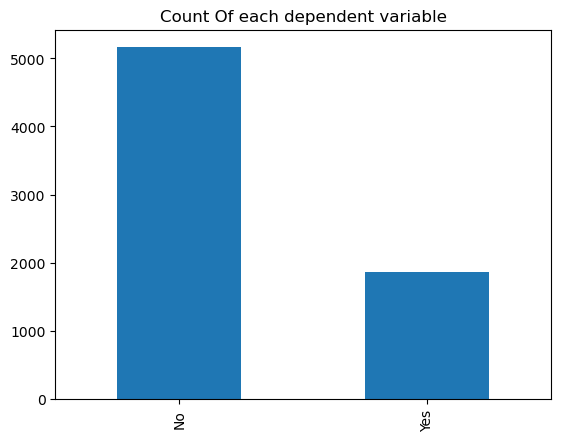

In [21]:
plt.title("Count Of each dependent variable")
(df["Churn"].value_counts()).plot(kind='bar')
plt.show()

In [22]:
df["Churn"].value_counts()/len(df["Churn"])

No     0.734215
Yes    0.265785
Name: Churn, dtype: float64

It shows that 26.5 % of the people from this data quit the service and the data set is not balanced one with ratio of 73: 27

**Creating Bins for Tenure,Monthly Charges,Total Charges**

In [23]:
df["tenure"].min(), df["tenure"].max()

(1, 72)

min tenure is 1 month and maximum tenure in 72 month(1 year) so we can create 6 bins with values of 12(1 year)

In [25]:
# Group the tenure in bins of 12 months
labels = ["{0} - < {1}".format(i, i + 11) for i in range(1, 72, 12)]
bins = [0, 12, 24, 36, 48, 60, 72]
df["Tenure_groups"] = pd.cut(df['tenure'], bins=bins, labels=labels)

In [26]:
df["Tenure_groups"].value_counts()

1 - < 12     2175
61 - < 72    1407
13 - < 24    1024
25 - < 36     832
49 - < 60     832
37 - < 48     762
Name: Tenure_groups, dtype: int64

In [27]:
df["TotalCharges"].min(), df["TotalCharges"].max()

(18.8, 8684.8)

In [28]:
labels = ["{0} - < {1}".format(i, i + 1500) for i in range(1, 9000, 1500)]
bins = [0, 1500, 3000, 4500, 6000, 7500, 9000]
df["TotalCharges_group"] = pd.cut(
    df["TotalCharges"], bins=bins, labels=labels, right=False)
df["TotalCharges_group"].value_counts()

1 - < 1501       3661
1501 - < 3001    1167
3001 - < 4501     808
4501 - < 6001     704
6001 - < 7501     498
7501 - < 9001     194
Name: TotalCharges_group, dtype: int64

In [29]:
df["MonthlyCharges"].min(), df["MonthlyCharges"].max()

(18.25, 118.75)

we can create 6 bins of 20s for monthly charges

In [30]:
labels = ["{0} - <{1}".format(i, i + 20) for i in range(1, 120, 20)]
bins = [0, 20, 40, 60, 80, 100, 120]
df["MonthlyCharges_grouped"] = pd.cut(
    df["MonthlyCharges"], bins=bins, labels=labels, right=False)
df["MonthlyCharges_grouped"].value_counts()

81 - <101     1768
61 - <81      1457
21 - <41      1220
41 - <61      1068
101 - <121     908
1 - <21        611
Name: MonthlyCharges_grouped, dtype: int64

In [31]:
# creating data frame for churned customer only
churned_customer_df = df[df["Churn"] == "Yes"]

**Separating numerical and categorical variables**

In [32]:
# extracting categorical variables
cat_variables = df.select_dtypes(
    include=['object', 'category']).columns.tolist()
cat_variables

['gender',
 'Partner',
 'Dependents',
 'PhoneService',
 'MultipleLines',
 'InternetService',
 'OnlineSecurity',
 'OnlineBackup',
 'DeviceProtection',
 'TechSupport',
 'StreamingTV',
 'StreamingMovies',
 'Contract',
 'PaperlessBilling',
 'PaymentMethod',
 'Churn',
 'Tenure_groups',
 'TotalCharges_group',
 'MonthlyCharges_grouped']

In [33]:
numerical_variables = [col for col in df.columns if col not in cat_variables]
numerical_variables

['SeniorCitizen', 'tenure', 'MonthlyCharges', 'TotalCharges']

## Uni Variate Analysis

In [34]:
# Finding variables with unique counts < input
def find_unique(df, count=1):
    cols = df.columns
    unique_var_list = []
    for col in cols:
        if df[col].nunique() <= count and col != "Churn":
            unique_var_list.append(col)
    return unique_var_list

In [35]:
unique_var_list = find_unique(df, 7)

In [36]:
len(unique_var_list)

19

In [37]:
# Finding variables with unique counts < input in churned customer data
unique_var_list_churned = find_unique(churned_customer_df, 7)

In [38]:
len(unique_var_list_churned)

19

In [39]:
# checking for all the unique columns from unique variable list included in churned unique var list
for _str in unique_var_list:
    if _str not in unique_var_list_churned:
        print(_str)

Every columns from unique var list is included in churned unique variable and lenth of both list are same.So no missing variables

In [40]:
# getting other columns which are not included in above analysis which has unique count > 5 ie: Continues variables

for col_name in df.columns:
    if col_name not in unique_var_list and col_name != "Churn":
        print(
            f"variable Name {col_name} ....... unique value count: {df[col_name].nunique()}")

variable Name tenure ....... unique value count: 72
variable Name MonthlyCharges ....... unique value count: 1584
variable Name TotalCharges ....... unique value count: 6530


### Proportion of each variable in data

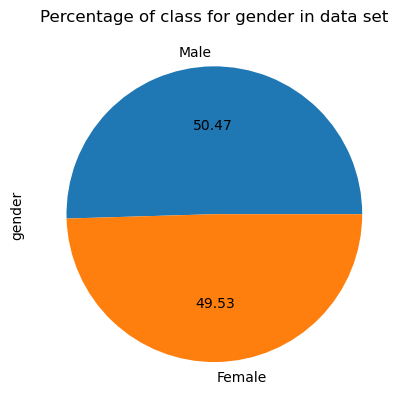

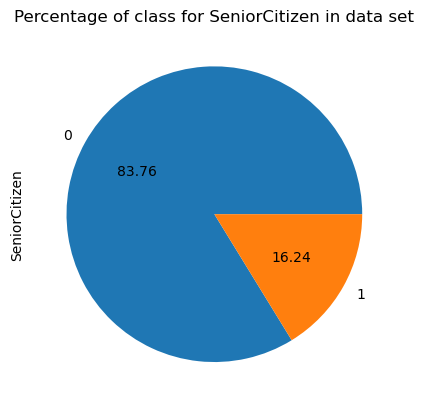

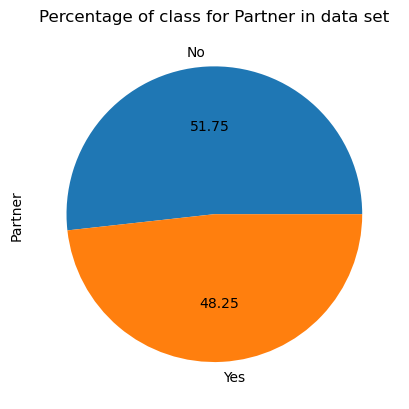

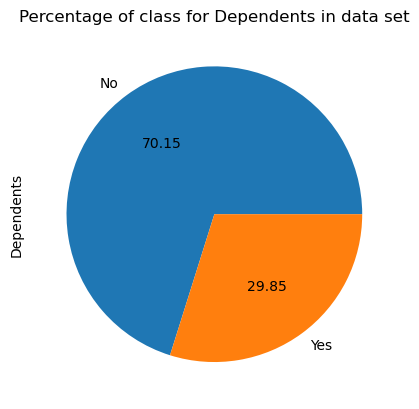

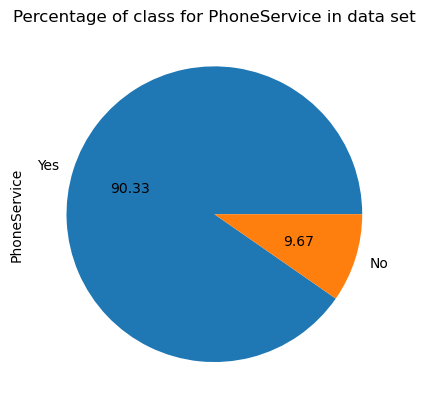

...

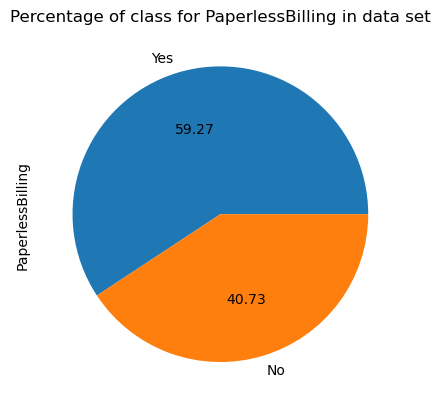

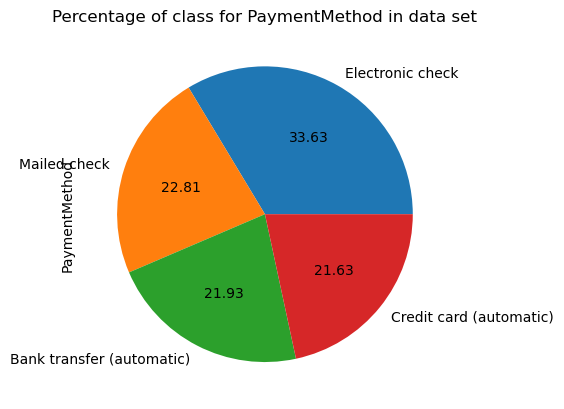

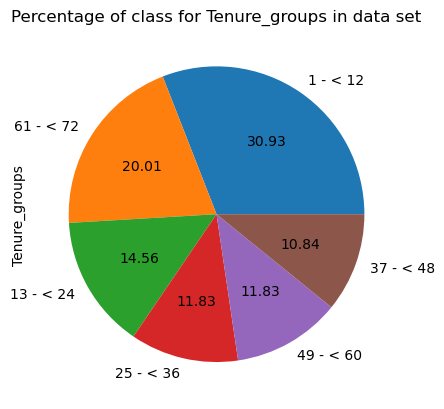

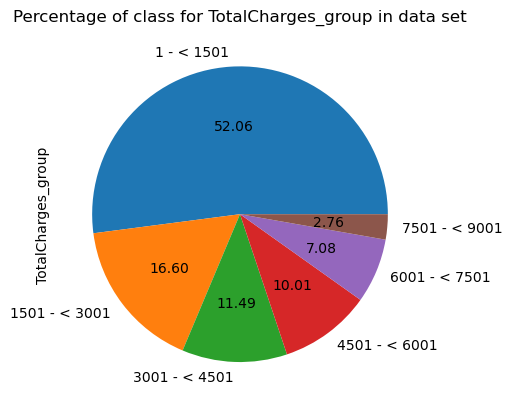

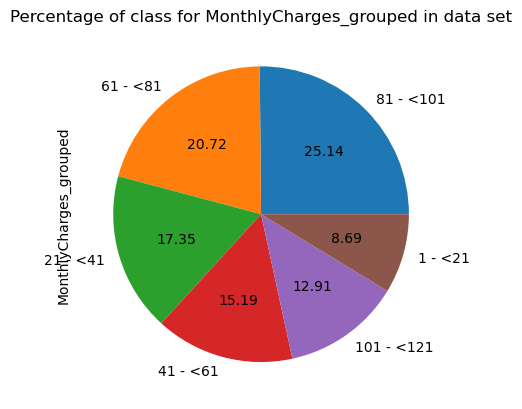

In [41]:
for col in unique_var_list:
    plt.title("Percentage of class for " + col + " in data set")
    (df[col].value_counts()/len(df)).plot(kind='pie', autopct='%.2f')
    plt.show()

count    7032.000000
mean       64.798208
std        30.085974
min        18.250000
25%        35.587500
50%        70.350000
75%        89.862500
max       118.750000
Name: MonthlyCharges, dtype: float64


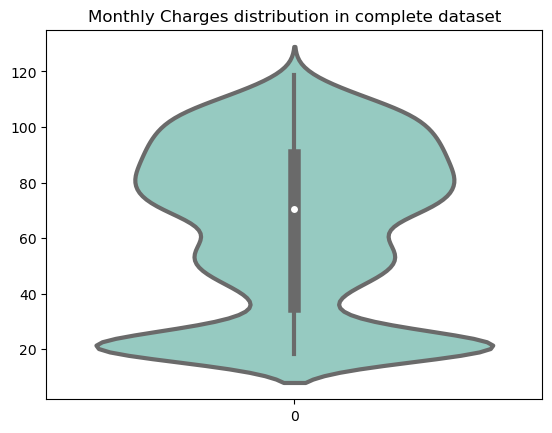

In [42]:
plt.title("Monthly Charges distribution in complete dataset")
print(df["MonthlyCharges"].describe())
sns.violinplot(df["MonthlyCharges"], inner="box",
               palette="Set3", cut=2, linewidth=3)
plt.show()

count    7032.000000
mean     2283.300441
std      2266.771362
min        18.800000
25%       401.450000
50%      1397.475000
75%      3794.737500
max      8684.800000
Name: TotalCharges, dtype: float64


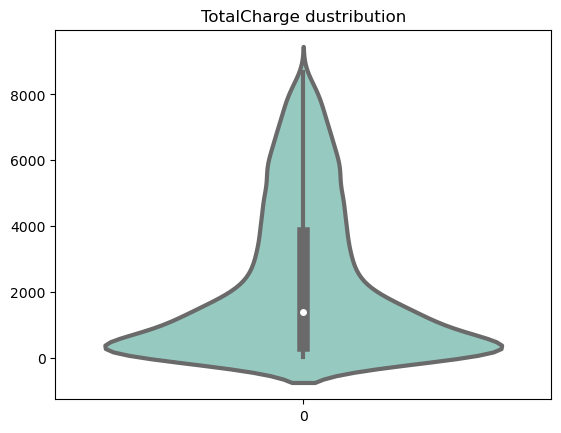

In [43]:

plt.title("TotalCharge dustribution")
print(df["TotalCharges"].describe())
sns.violinplot(df["TotalCharges"], inner="box",
               palette="Set3", cut=2, linewidth=3)
plt.show()

count    7032.000000
mean       32.421786
std        24.545260
min         1.000000
25%         9.000000
50%        29.000000
75%        55.000000
max        72.000000
Name: tenure, dtype: float64


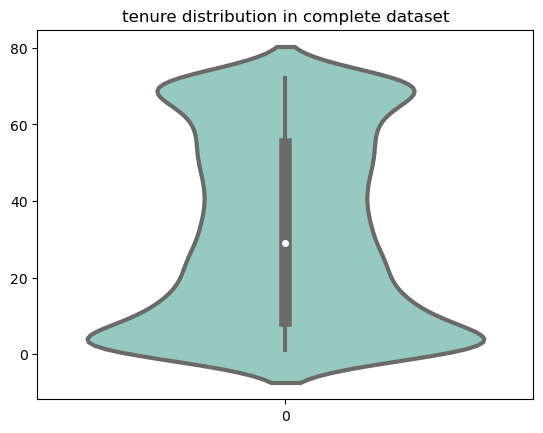

In [44]:

plt.title("tenure distribution in complete dataset")
print(df["tenure"].describe())
sns.violinplot(df["tenure"], inner="box",
               palette="Set3", cut=2, linewidth=3)
plt.show()

* We can see that an density of people who pay monthly charge less than 40 usd is high.i.e people who love low package<br>
people with low total package are huge in number <br> 
* Tenure has an interesting distribution which says people who have very small tenure and high tenure are comparatively high and compared to people who have and intermediate tenure range <br>

We can try to create bins for Total package ,Tenure,Monthly Package in preprocessing And Analyse again

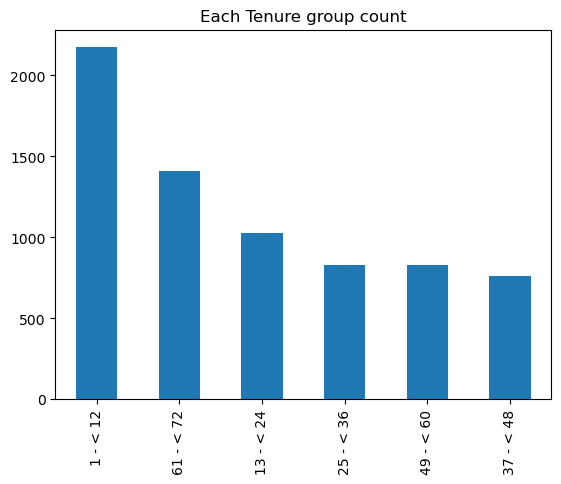

In [45]:
plt.title("Each Tenure group count")
df["Tenure_groups"].value_counts().plot(kind="bar")
plt.show()

this confirm our assumptions which we got from violin plot ,
for poeple who have less than 1 year of tenure greater than 5 year of tenure is high as compared to other groups

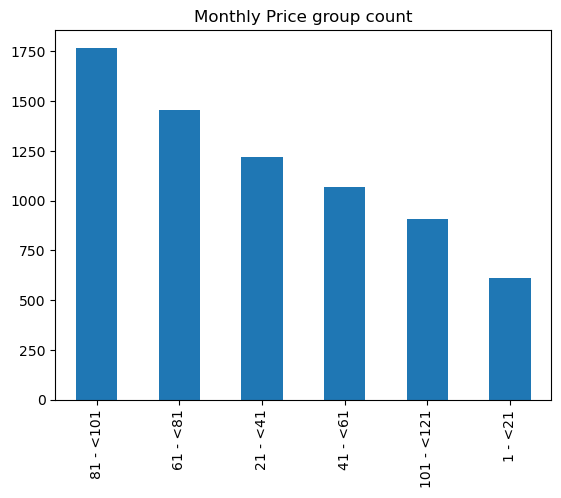

In [46]:
plt.title("Monthly Price group count")
df["MonthlyCharges_grouped"].value_counts().plot(kind="bar")
plt.show()

In [47]:
df["MonthlyCharges_grouped"].value_counts()

81 - <101     1768
61 - <81      1457
21 - <41      1220
41 - <61      1068
101 - <121     908
1 - <21        611
Name: MonthlyCharges_grouped, dtype: int64

In [48]:
(1457 + 1768)/len(df)

0.45861774744027306

* people who chose the price < 20 are less 
* package range between 61-100 have large number of customers(46 %)

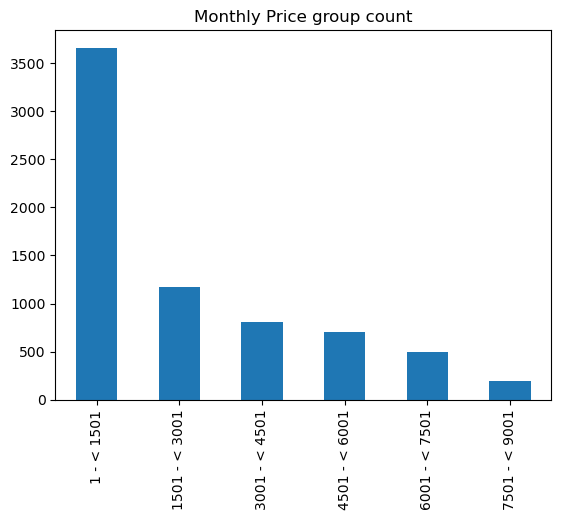

In [49]:
plt.title("Monthly Price group count")
df["TotalCharges_group"].value_counts().plot(kind="bar")
plt.show()

### Univariate analysis based on dependant variable

In [50]:
unique_var_list

['gender',
 'SeniorCitizen',
 'Partner',
 'Dependents',
 'PhoneService',
 'MultipleLines',
 'InternetService',
 'OnlineSecurity',
 'OnlineBackup',
 'DeviceProtection',
 'TechSupport',
 'StreamingTV',
 'StreamingMovies',
 'Contract',
 'PaperlessBilling',
 'PaymentMethod',
 'Tenure_groups',
 'TotalCharges_group',
 'MonthlyCharges_grouped']

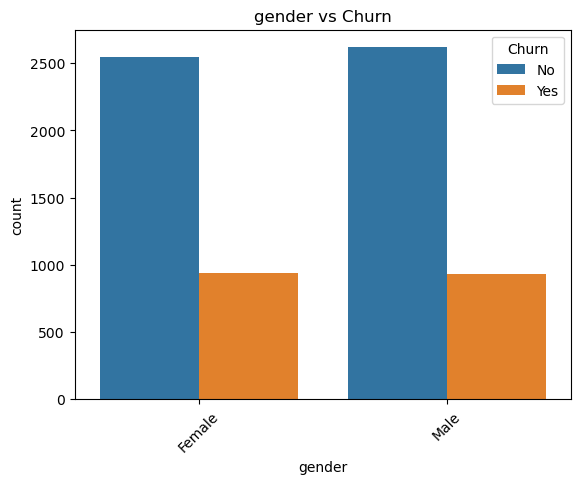

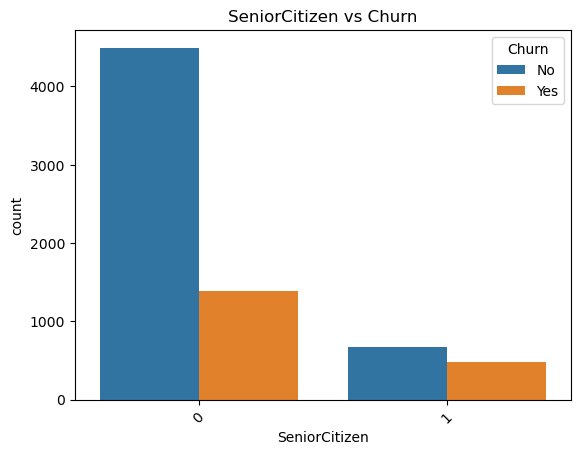

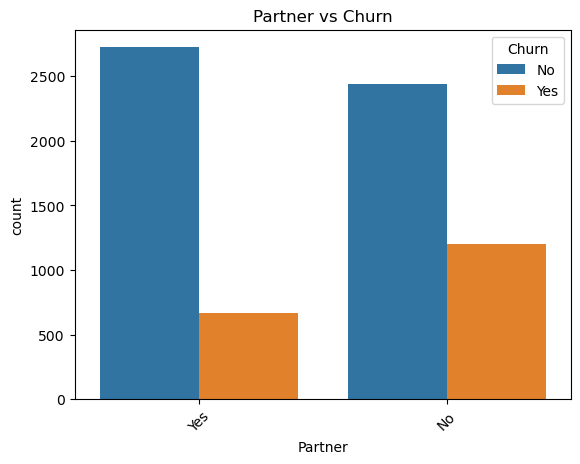

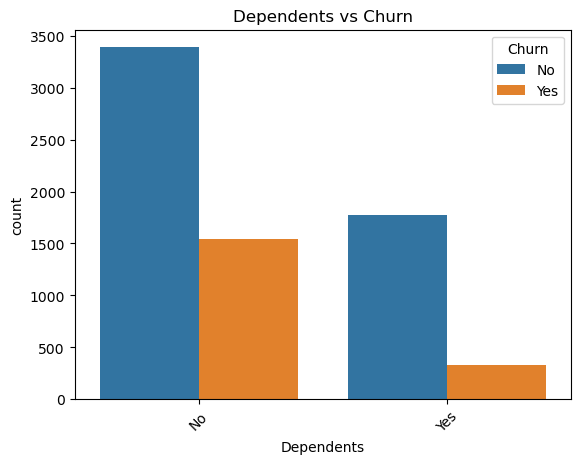

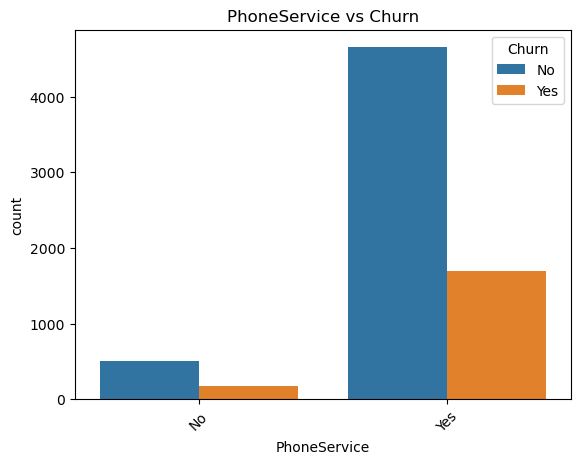

...

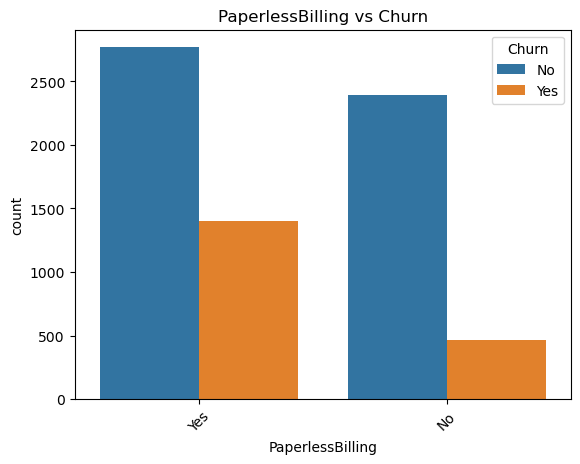

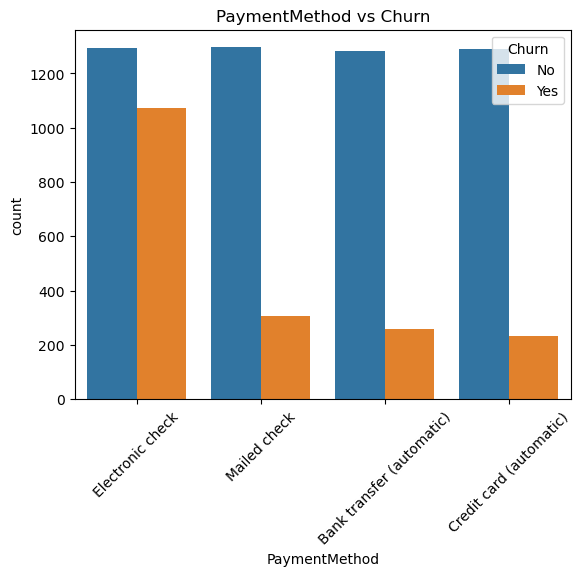

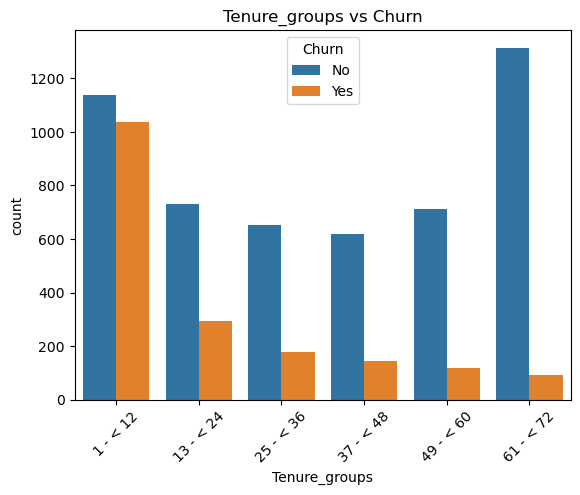

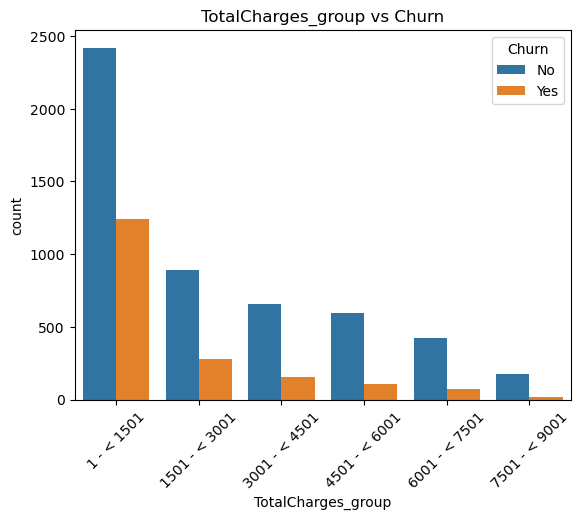

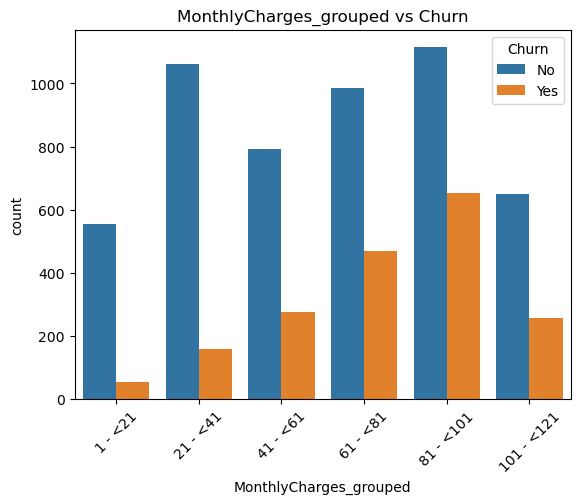

In [51]:
# creating count plot  for every categorical variable
for col in unique_var_list:
    plt.title(f"{col} vs Churn")
    sns.countplot(data=df, x=col, hue="Churn")
    plt.xticks(rotation=45)
    plt.show()

### Univariate Analysis of churned data

   gender     Churn
0  Female  0.502408
1    Male  0.497592


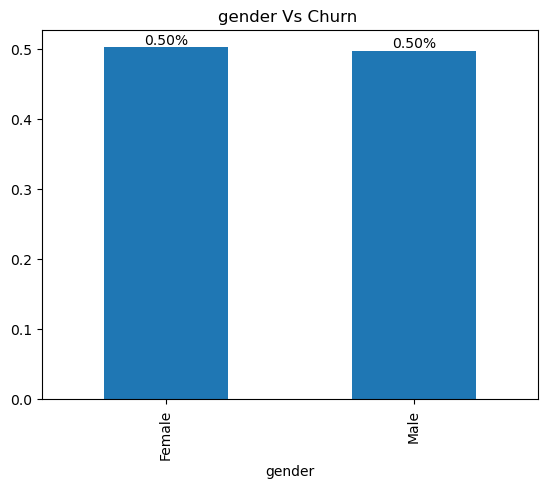

   SeniorCitizen     Churn
0              0  0.745318
1              1  0.254682


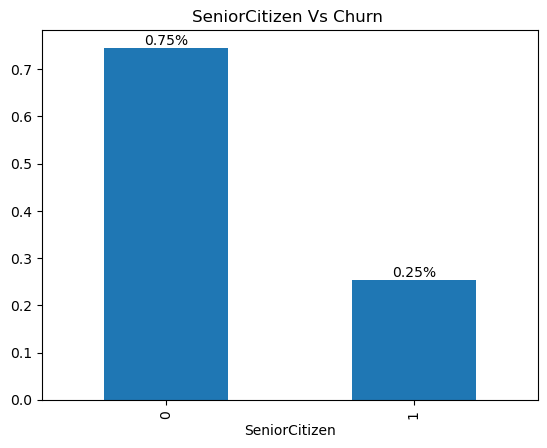

  Partner     Churn
0      No  0.642055
1     Yes  0.357945


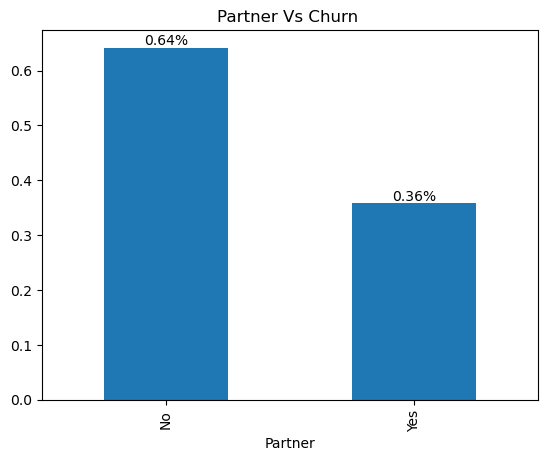

  Dependents     Churn
0         No  0.825575
1        Yes  0.174425


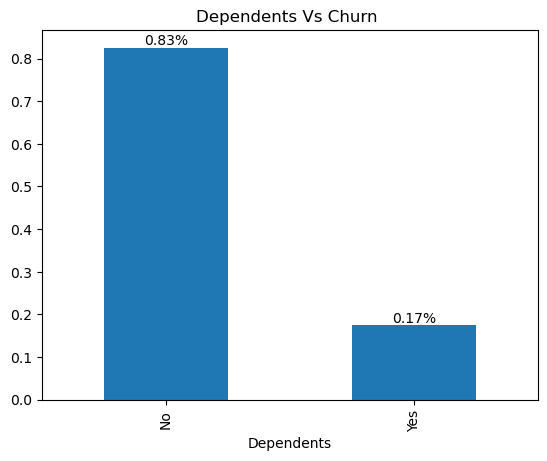

  PhoneService     Churn
0           No  0.090958
1          Yes  0.909042


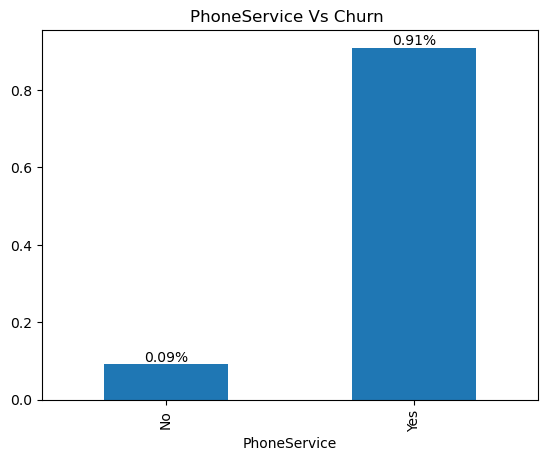

      MultipleLines     Churn
0                No  0.454254
1  No phone service  0.090958
2               Yes  0.454789


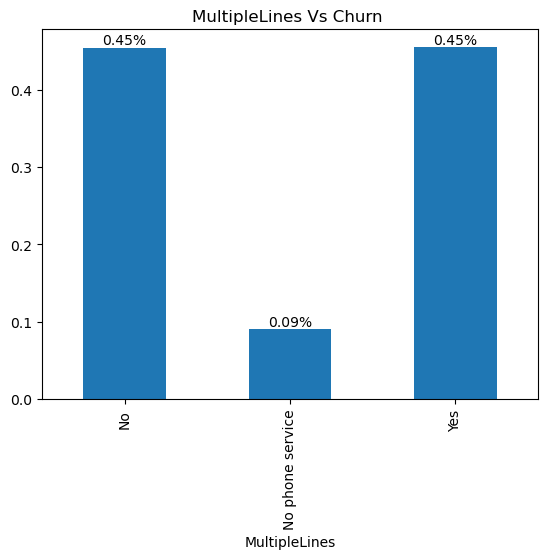

  InternetService     Churn
0             DSL  0.245586
1     Fiber optic  0.693954
2              No  0.060460


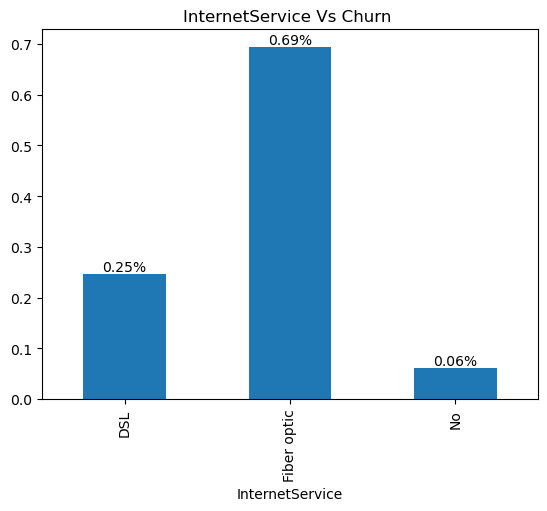

        OnlineSecurity     Churn
0                   No  0.781701
1  No internet service  0.060460
2                  Yes  0.157838


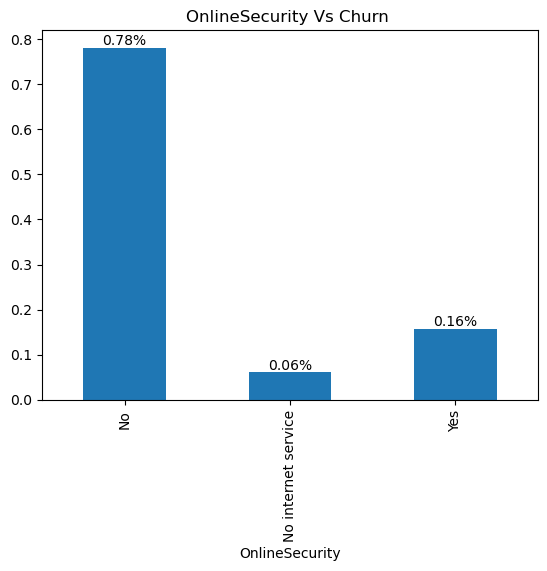

          OnlineBackup     Churn
0                   No  0.659711
1  No internet service  0.060460
2                  Yes  0.279829


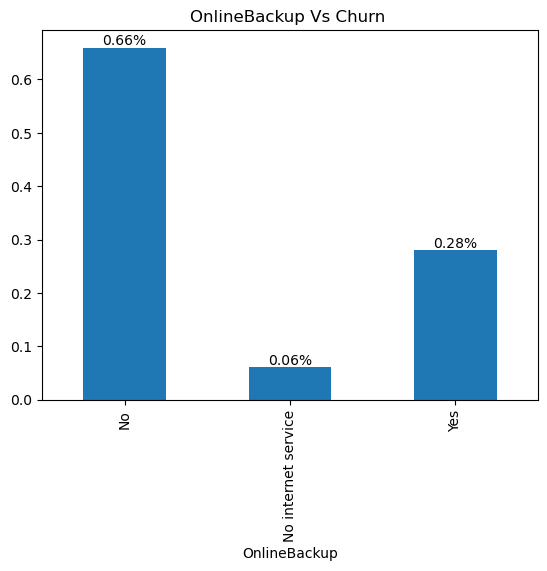

      DeviceProtection    Churn
0                   No  0.64794
1  No internet service  0.06046
2                  Yes  0.29160


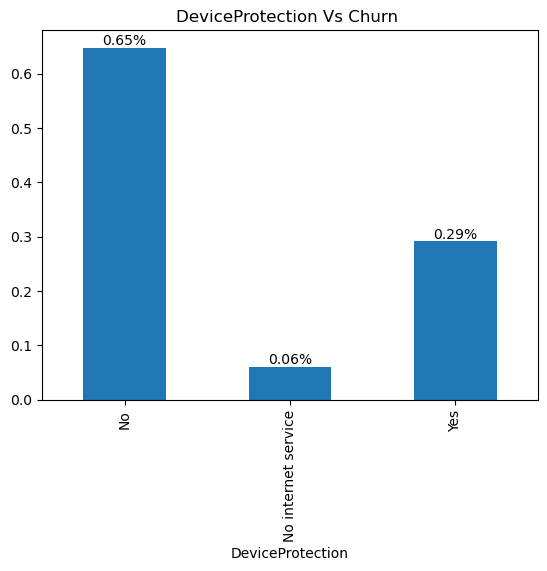

           TechSupport     Churn
0                   No  0.773676
1  No internet service  0.060460
2                  Yes  0.165864


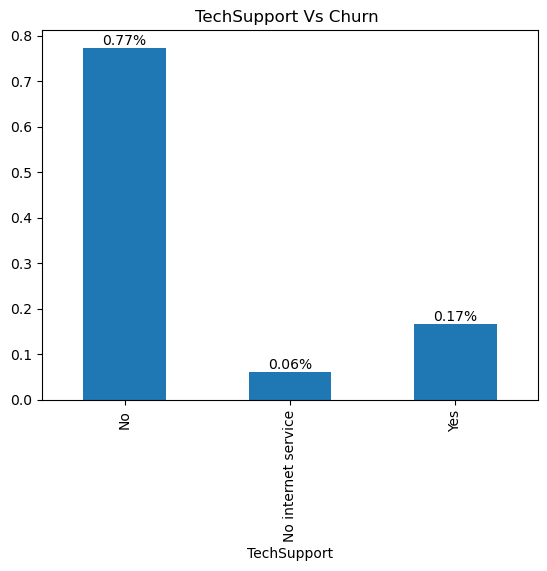

           StreamingTV     Churn
0                   No  0.504013
1  No internet service  0.060460
2                  Yes  0.435527


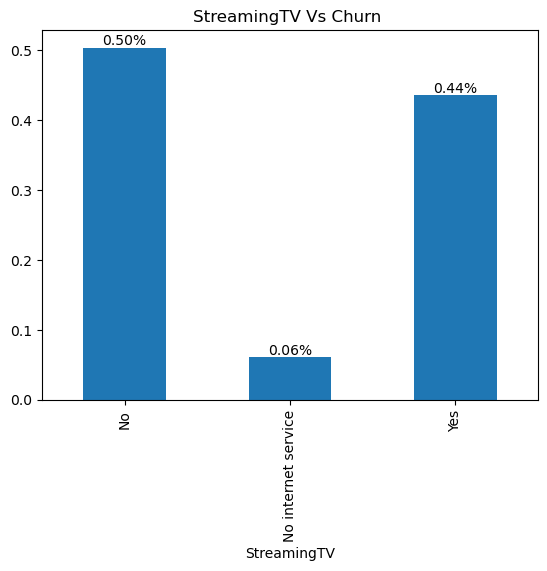

       StreamingMovies     Churn
0                   No  0.501873
1  No internet service  0.060460
2                  Yes  0.437667


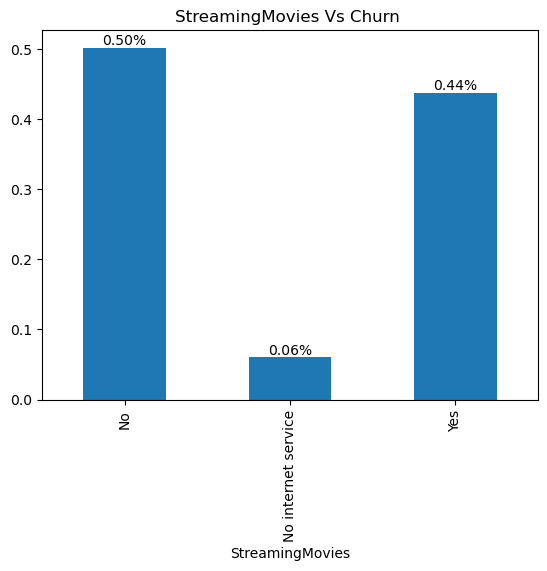

         Contract     Churn
0  Month-to-month  0.885500
1        One year  0.088818
2        Two year  0.025682


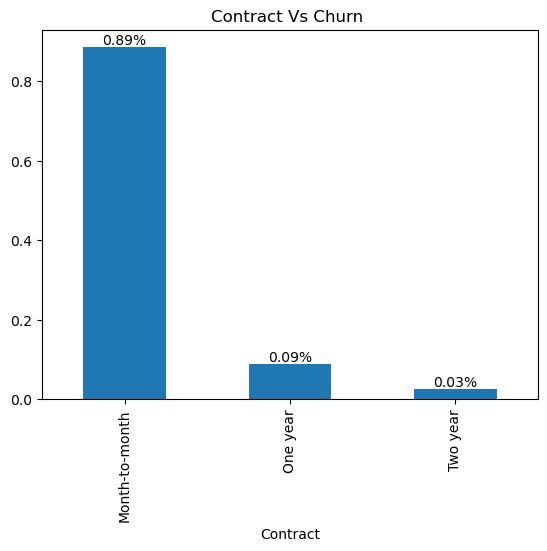

  PaperlessBilling     Churn
0               No  0.250936
1              Yes  0.749064


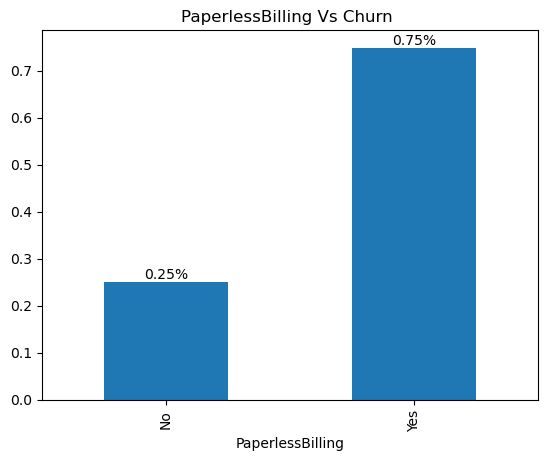

               PaymentMethod     Churn
0  Bank transfer (automatic)  0.138042
1    Credit card (automatic)  0.124131
2           Electronic check  0.573034
3               Mailed check  0.164794


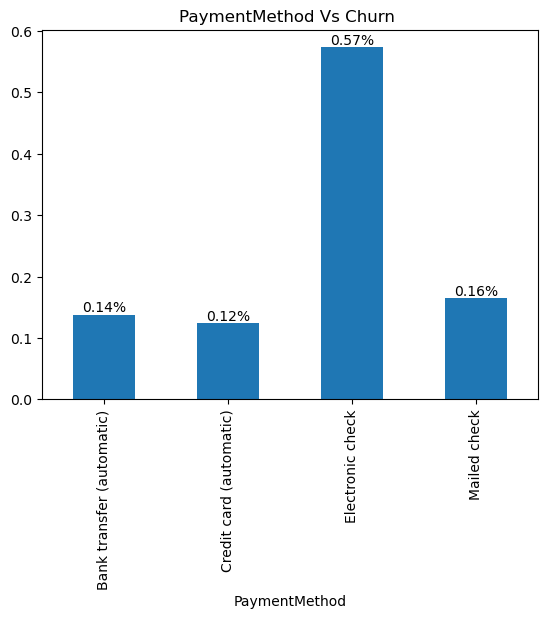

  Tenure_groups     Churn
0      1 - < 12  0.554842
1     13 - < 24  0.157303
2     25 - < 36  0.096308
3     37 - < 48  0.077582
4     49 - < 60  0.064205
5     61 - < 72  0.049759


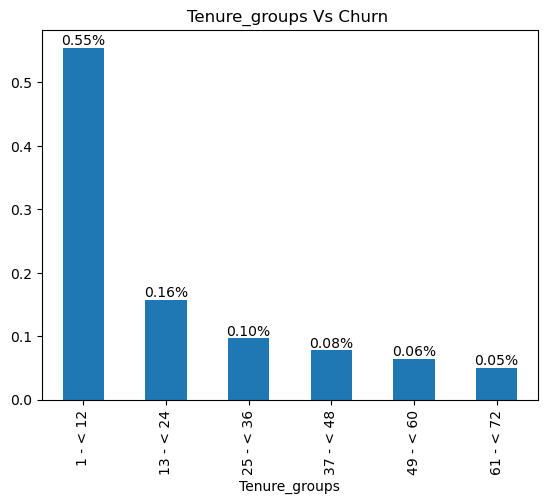

  TotalCharges_group     Churn
0         1 - < 1501  0.663991
1      1501 - < 3001  0.148743
2      3001 - < 4501  0.081327
3      4501 - < 6001  0.058855
4      6001 - < 7501  0.038523
5      7501 - < 9001  0.008561


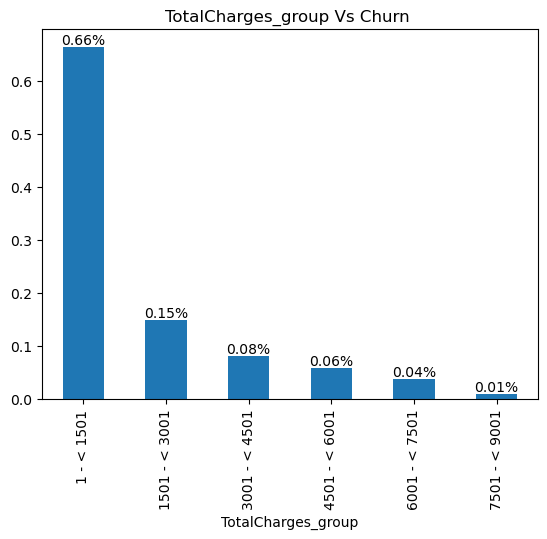

  MonthlyCharges_grouped     Churn
0                1 - <21  0.029428
1               21 - <41  0.084537
2               41 - <61  0.147673
3               61 - <81  0.251471
4              81 - <101  0.349385
5             101 - <121  0.137507


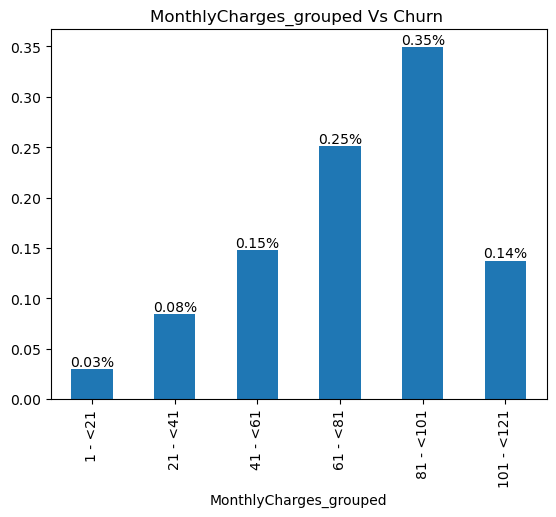

In [52]:
# ploting how much every variable churned
for col in unique_var_list:
    if col != "Churn":
        plt.title(col + " Vs Churn ")
        data = (churned_customer_df.groupby(col)[
                "Churn"].count()/len(churned_customer_df[col]))
        p1 = data.plot(kind="bar")
        for p in p1.containers:
            p1.bar_label(p, fmt='%.2f%%', label_type='edge')
        print(data.reset_index())
        plt.show()

##3 univariate analysis summary <br>
* package range between 61-100 have large number of customers(46 %) - these price range have most number of churners
* 52 % customers pays less than < 1500 in total charges (these groups have most number of churners)
* people who have tenure have < 12 months and 61 to 72 months are high(loyal customers),but people who have < 12 churn more and with 62 - 72(5 year) tenure group churn very less
* people who don't have partner,dependents,not senior citizen, are more likely to churn
* People without online security,device protection,tech support,No online backup increase churn rate
* Monthly Contract People have more churn rate as compared to other groups
* People who use Electronic check and PaperlessBilling have more chance to churn (we need to check other factors like no dependents,no partner to with these to confirm if there is an relation people who are young mostly dependents on these methods)

## Bivariate Multi variate analysis

In [53]:
# converting the values yes to 1 and no to zero
df['Churn'] = np.where(df.Churn == 'Yes', 1, 0)

In [54]:
df_dummies_no_dropped = pd.get_dummies(data=df)

In [55]:
df_dummies_no_dropped.shape

(7032, 64)

In [56]:
df_dummies_dropped = pd.get_dummies(data=df, drop_first=True)

In [57]:
df_dummies_dropped.to_csv("df_dummies_dropped.csv")

In [69]:
df_dummies_dropped.shape

(7032, 46)

In [58]:
len(unique_var_list)

19

#### Categorical Vs Categerical

In [59]:
def heatmap_for_two_category(unique_var_list, data, title=" Title"):
    for i in range(len(unique_var_list)):
        print(
            f">>>>>>>>>>>>>>> {unique_var_list[i]} vs other categorical Variables")
        for j in range(i+1, len(unique_var_list)):
            plt.title(title + f" {unique_var_list[i]} vs {unique_var_list[j]}")
            sns.heatmap(pd.crosstab(
                data[unique_var_list[i]], data[unique_var_list[j]]), annot=True, fmt='.0f')
            plt.show()

>>>>>>>>>>>>>>> gender vs other categorical Variables


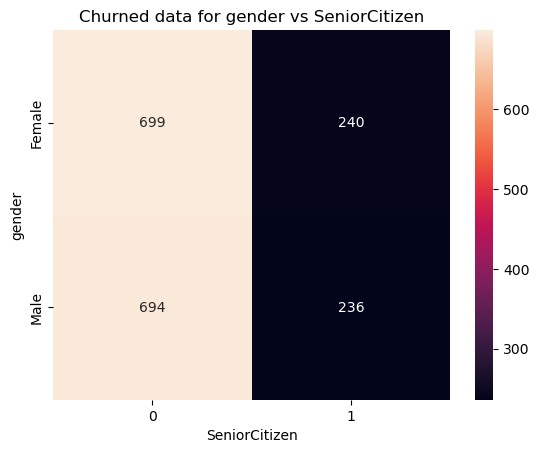

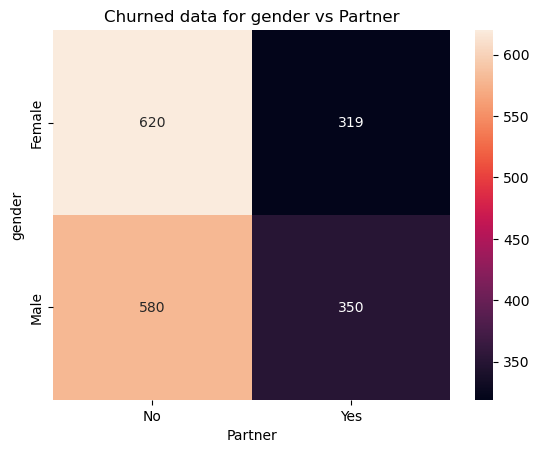

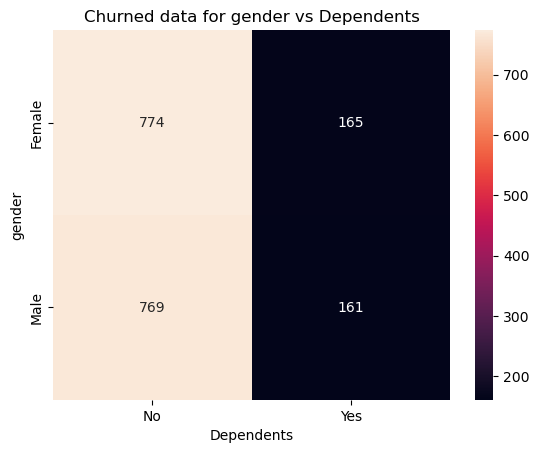

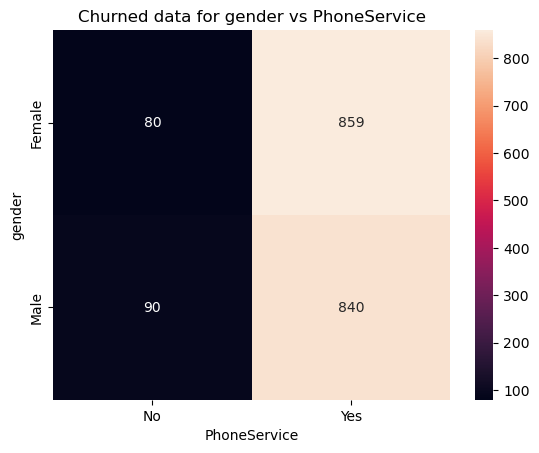

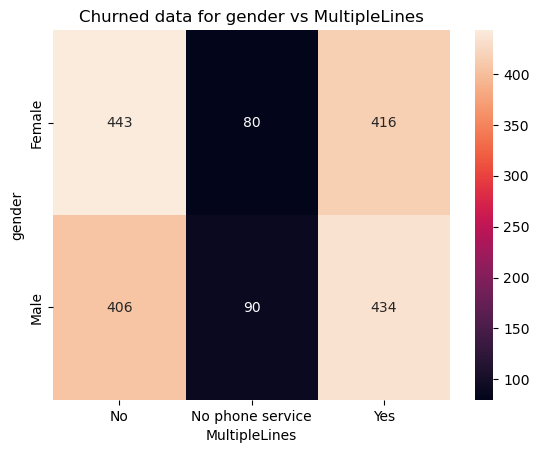

...

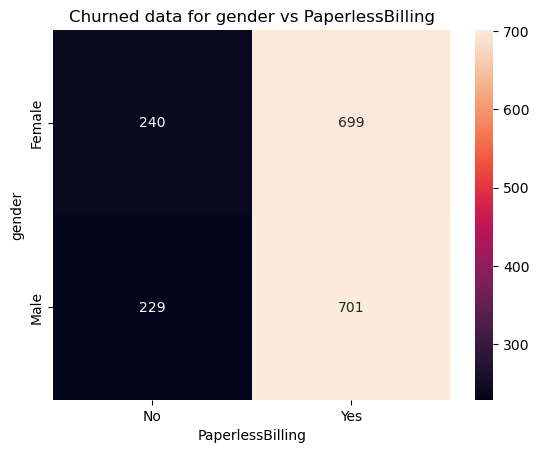

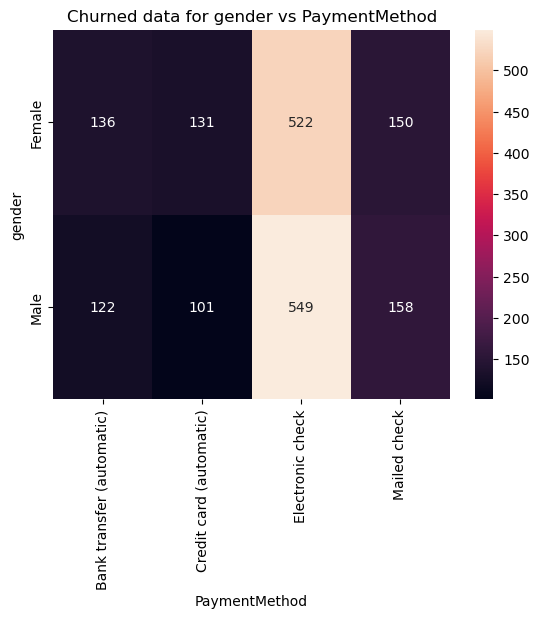

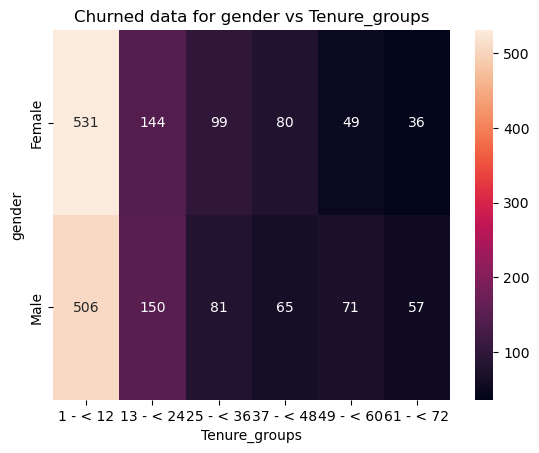

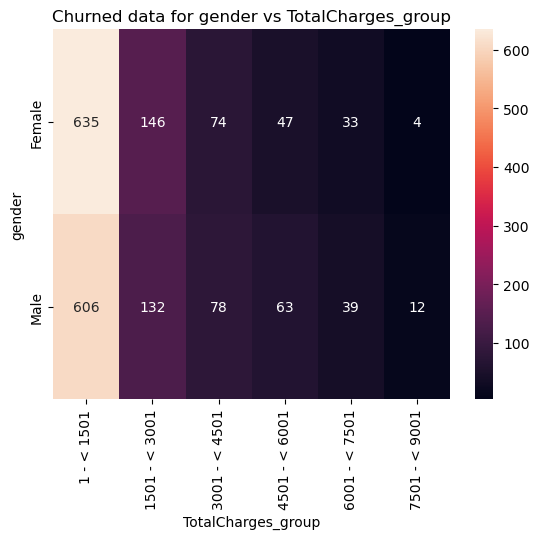

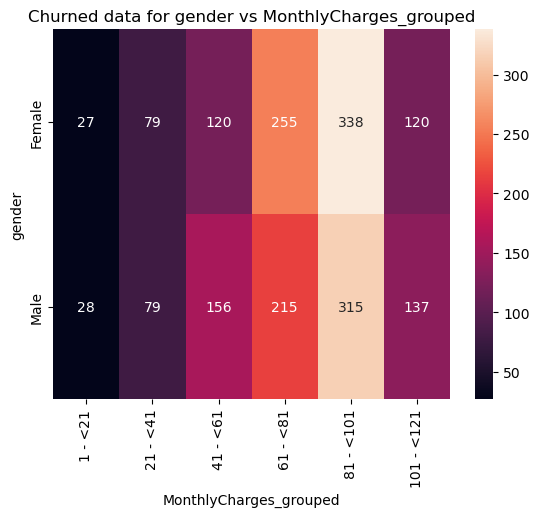

>>>>>>>>>>>>>>> SeniorCitizen vs other categorical Variables


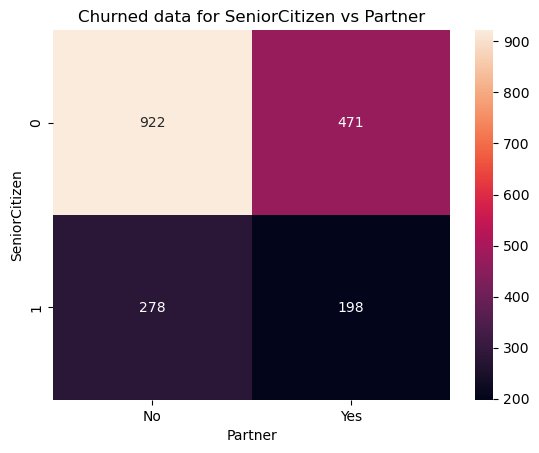

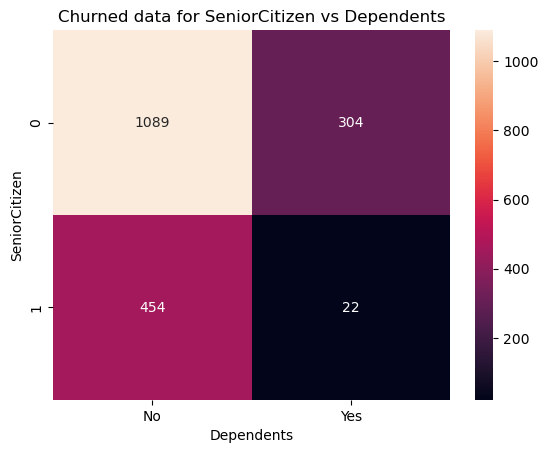

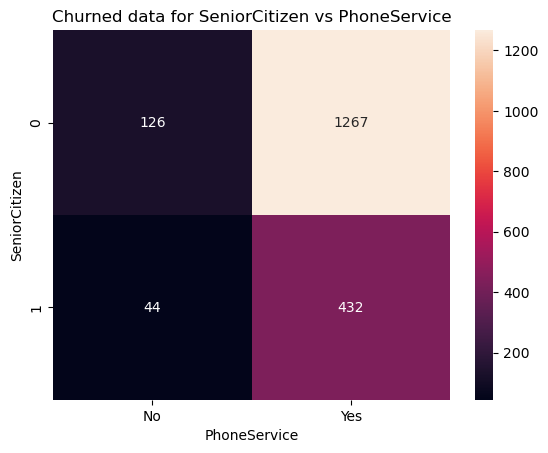

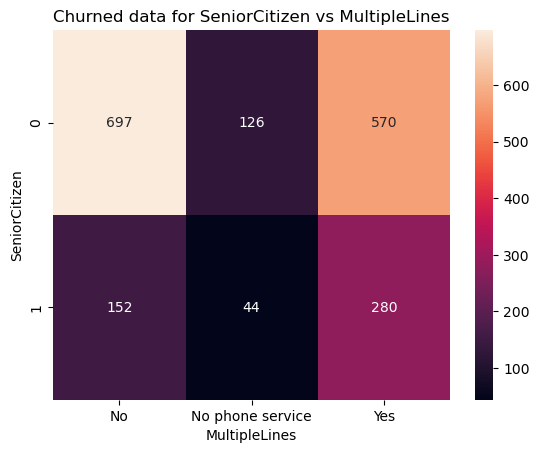

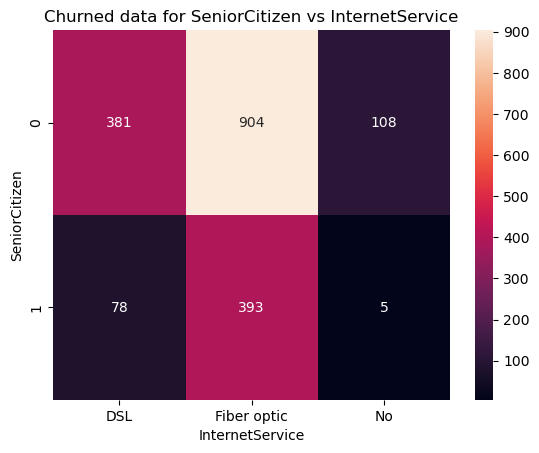

...

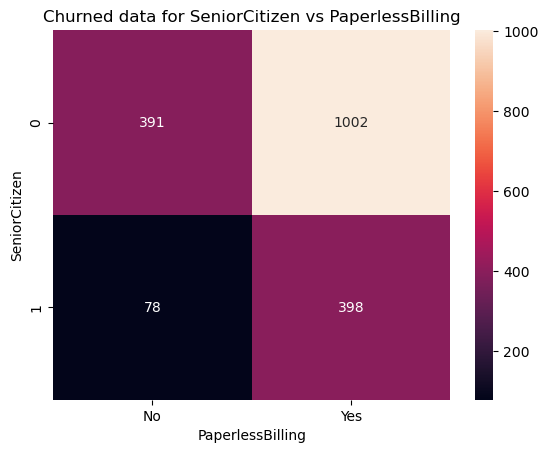

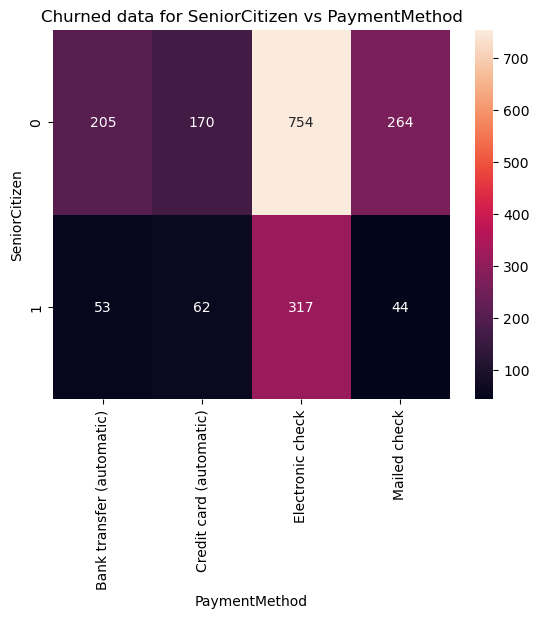

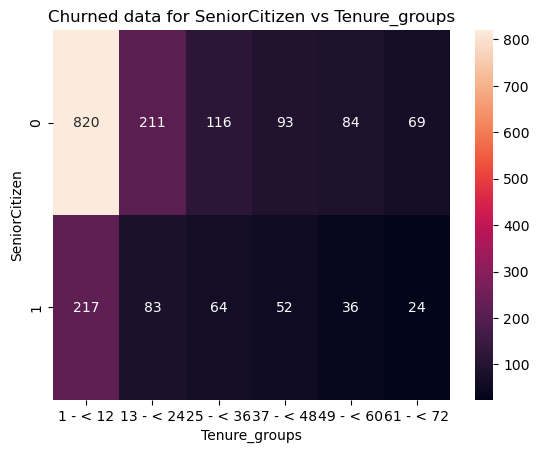

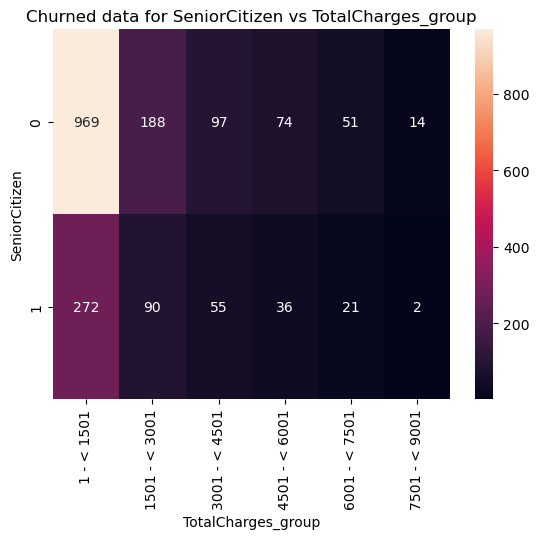

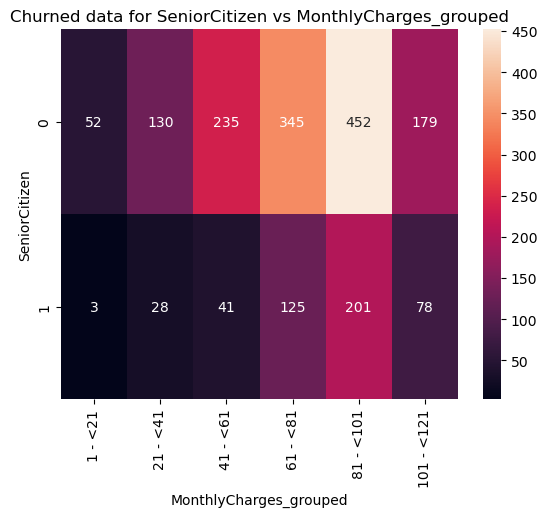

>>>>>>>>>>>>>>> Partner vs other categorical Variables


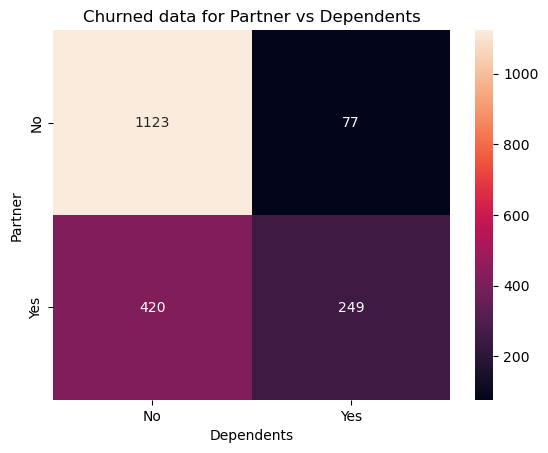

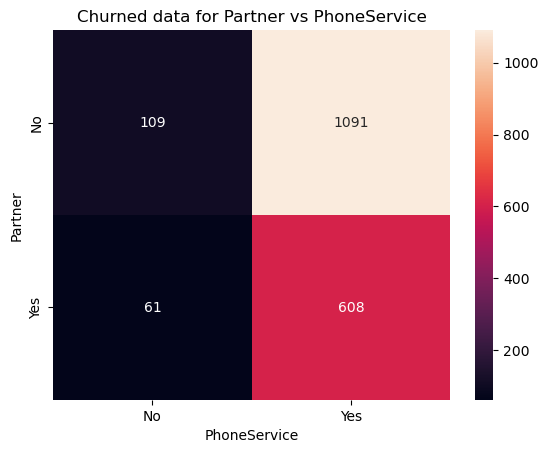

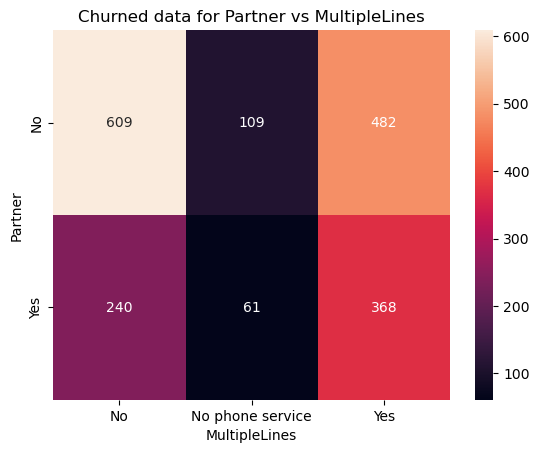

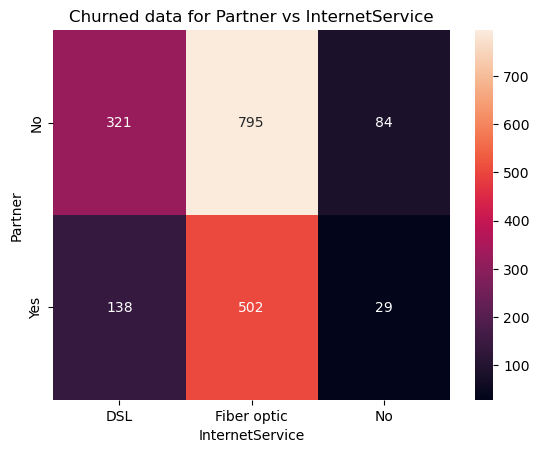

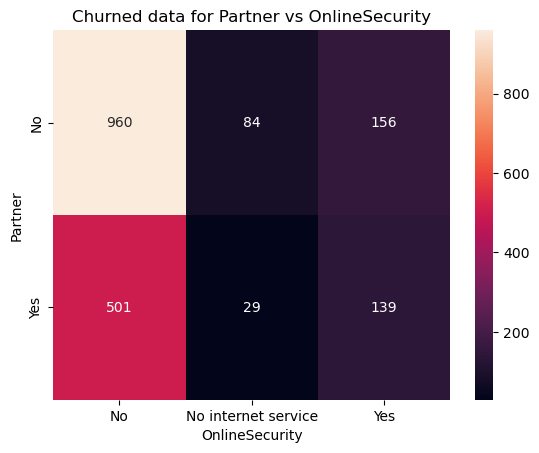

...

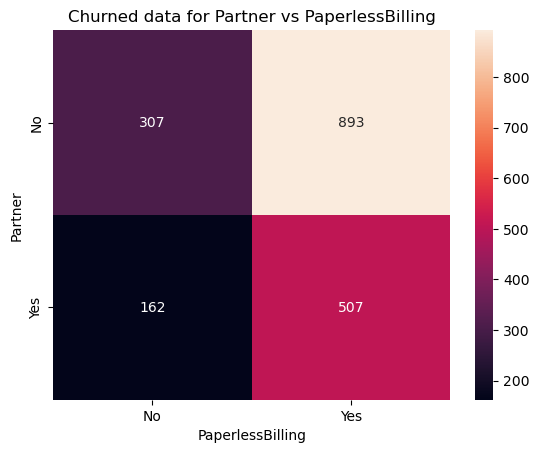

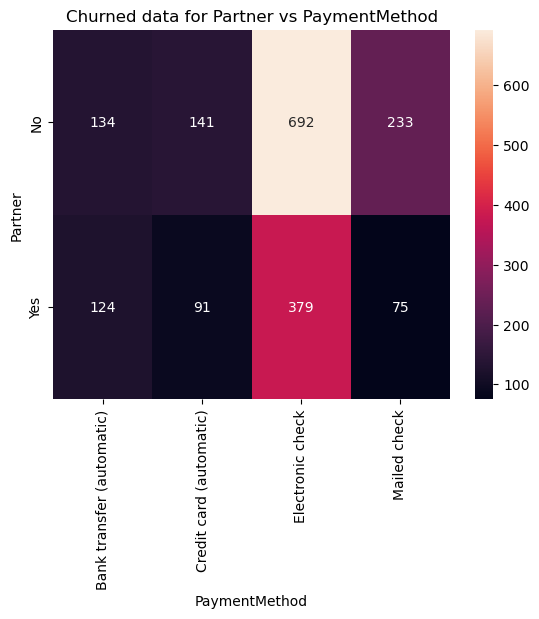

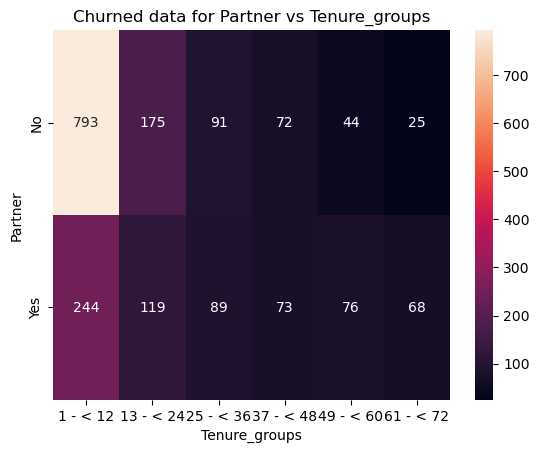

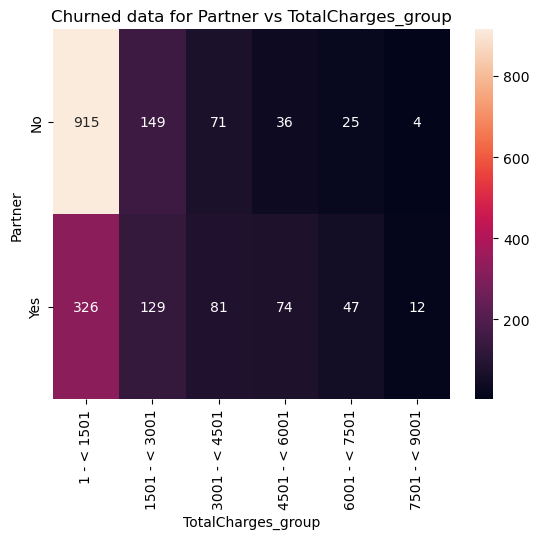

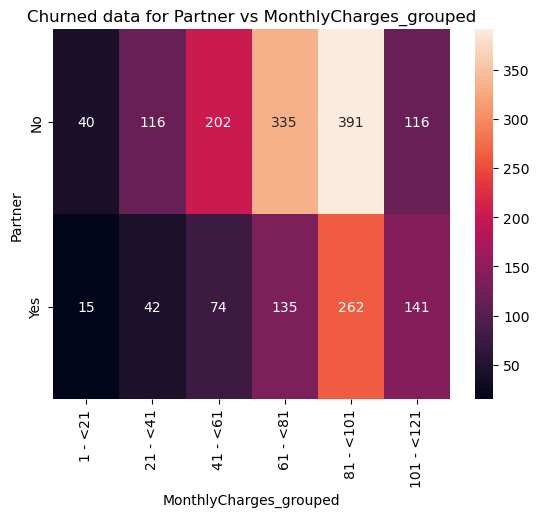

>>>>>>>>>>>>>>> Dependents vs other categorical Variables


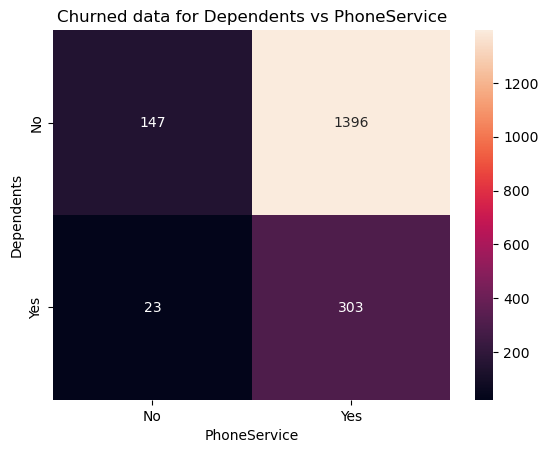

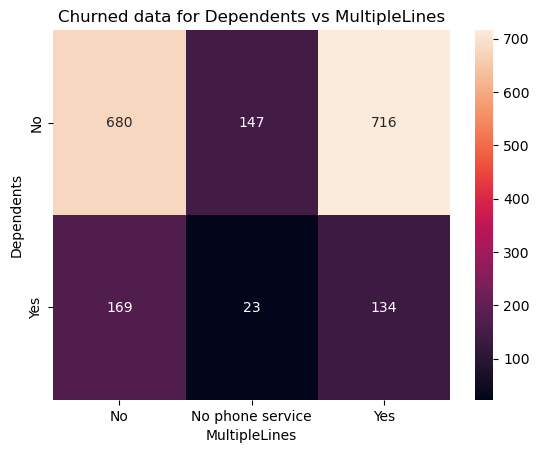

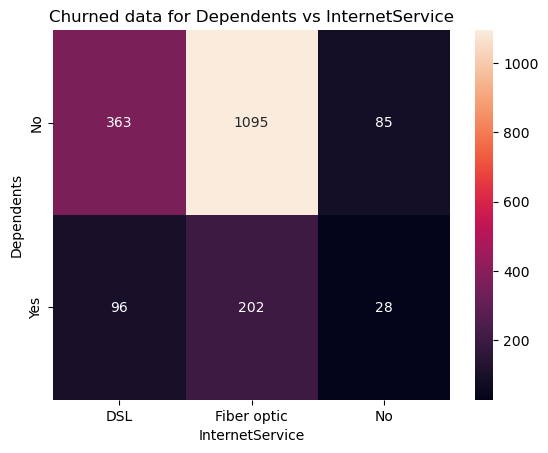

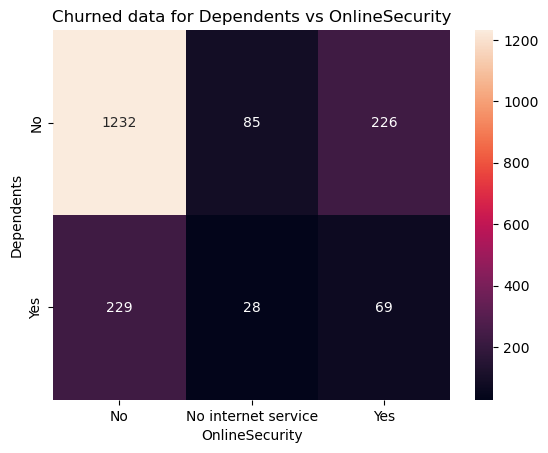

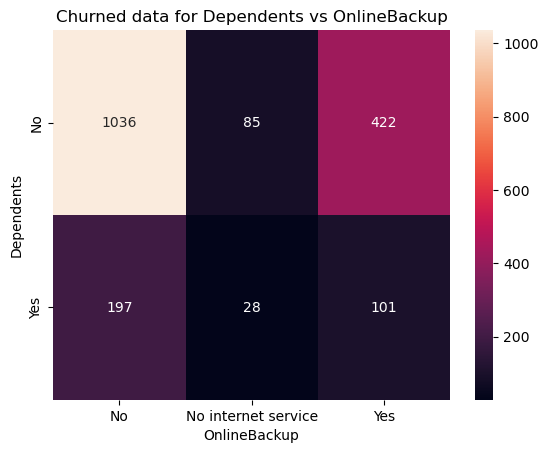

...

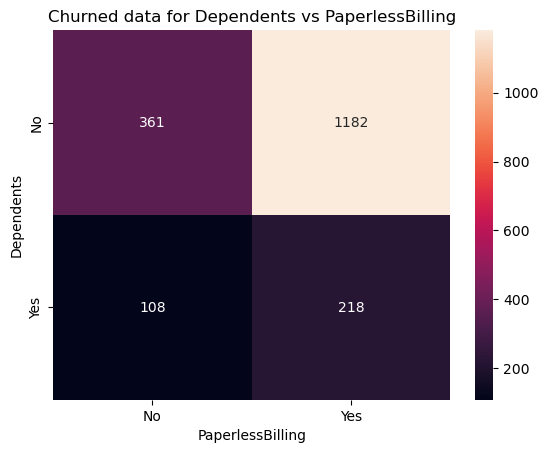

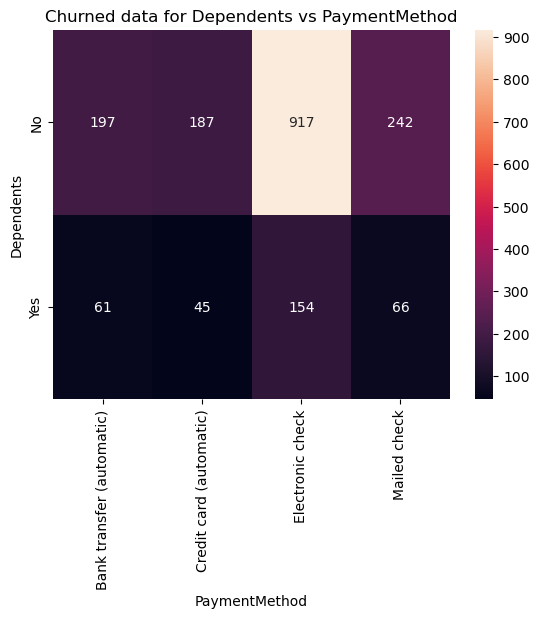

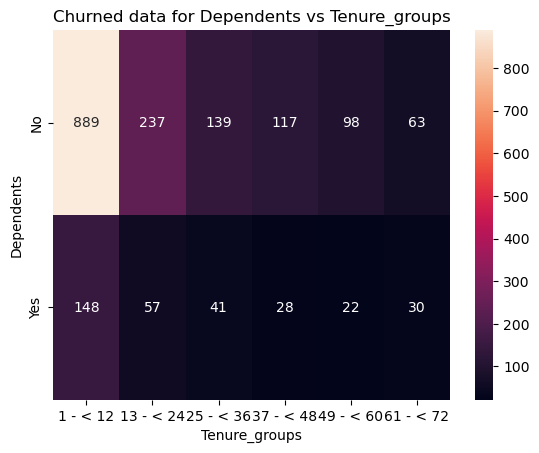

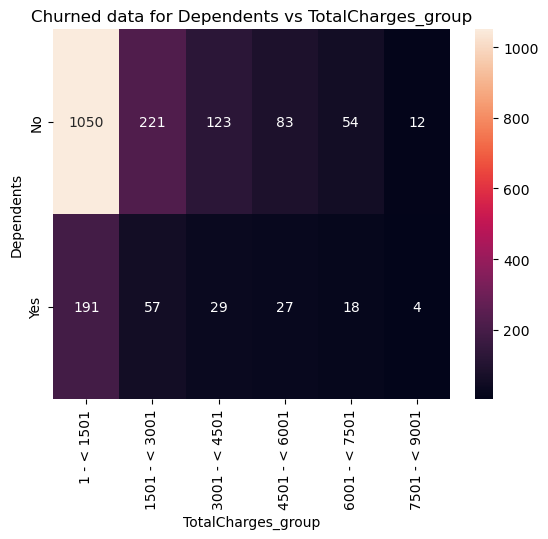

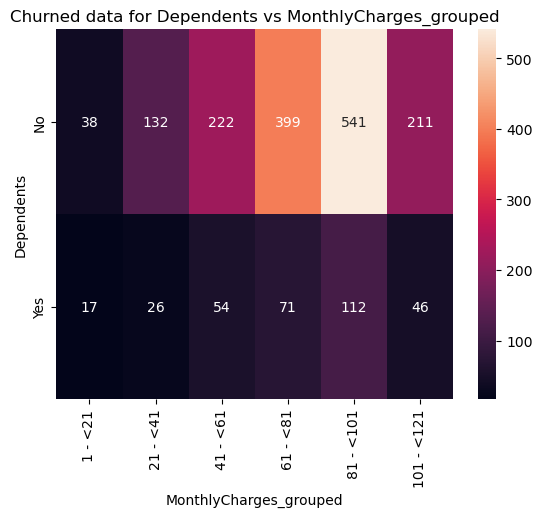

>>>>>>>>>>>>>>> PhoneService vs other categorical Variables


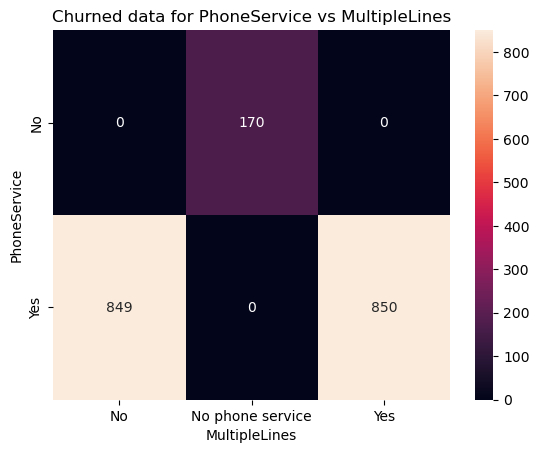

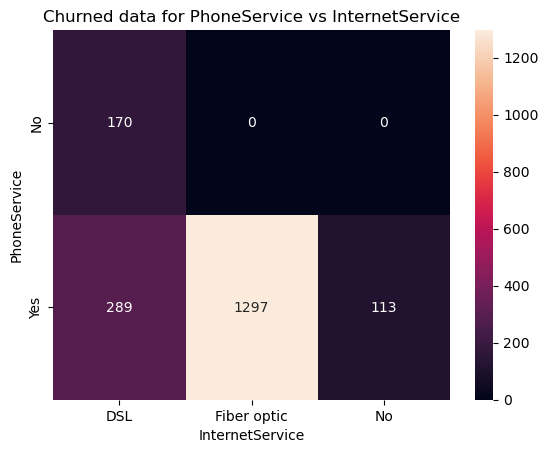

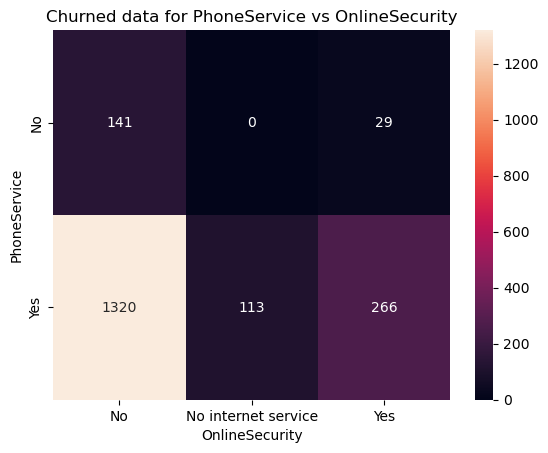

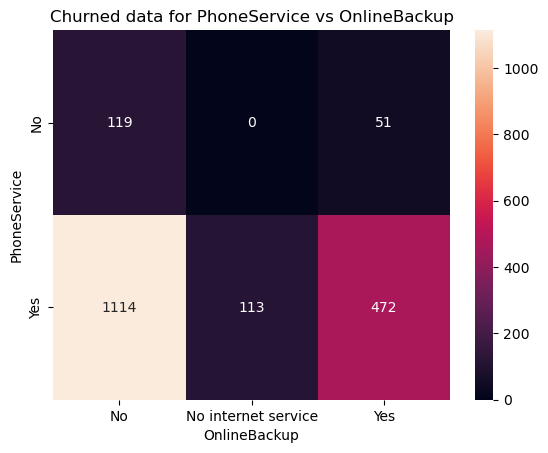

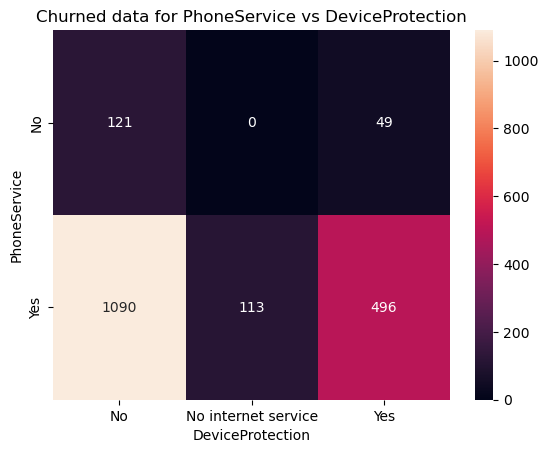

...

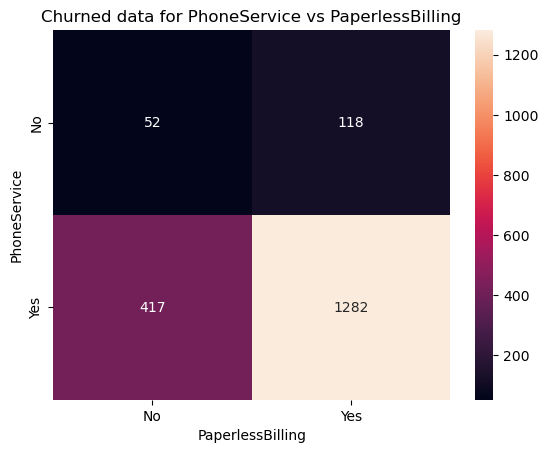

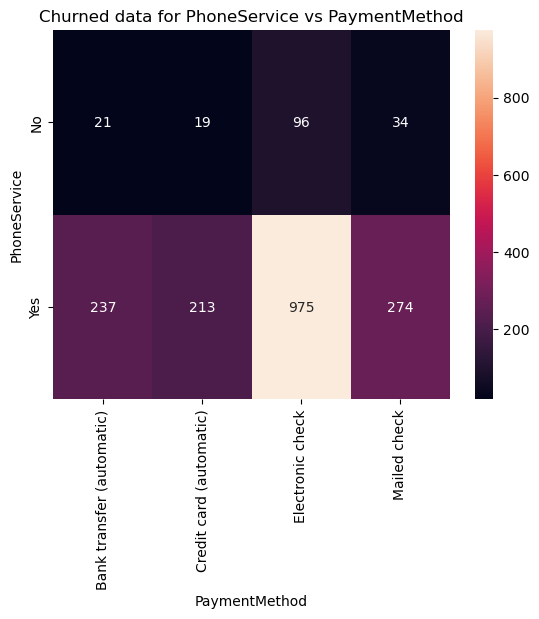

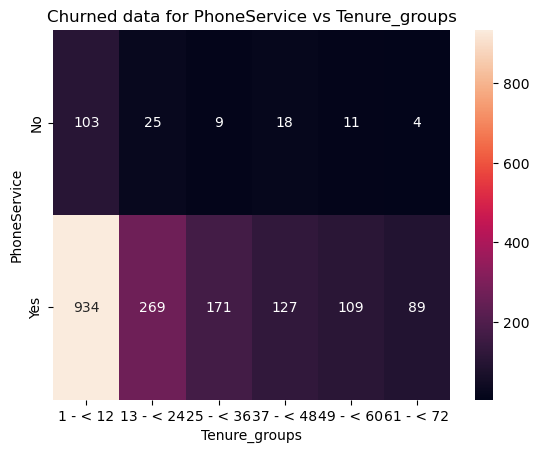

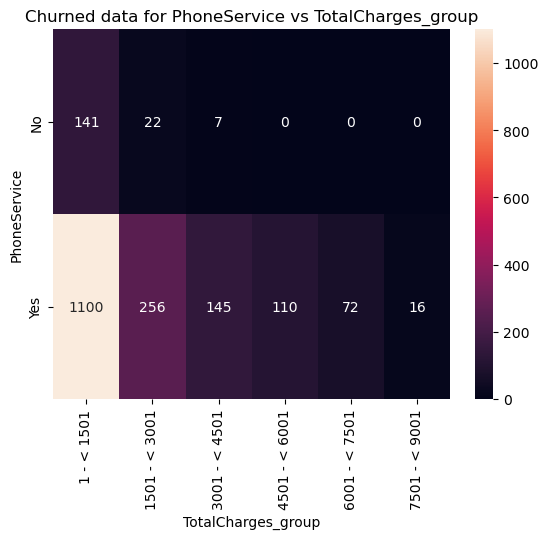

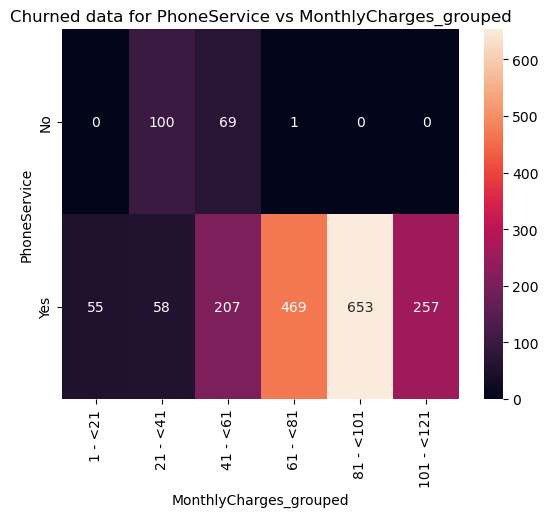

>>>>>>>>>>>>>>> MultipleLines vs other categorical Variables


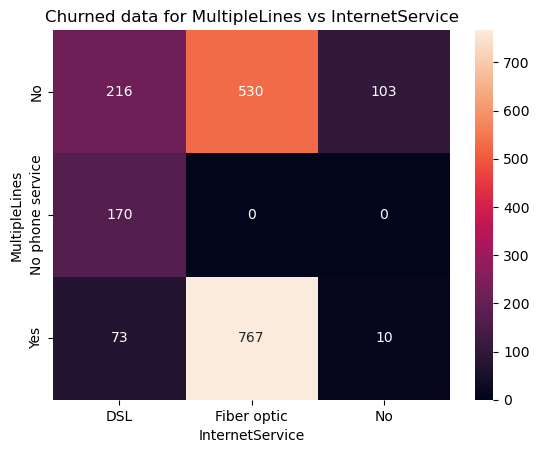

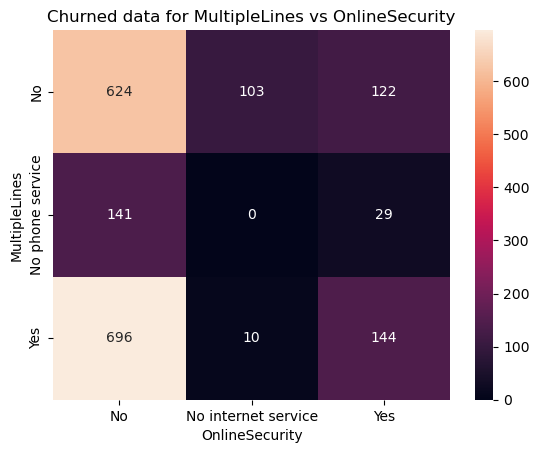

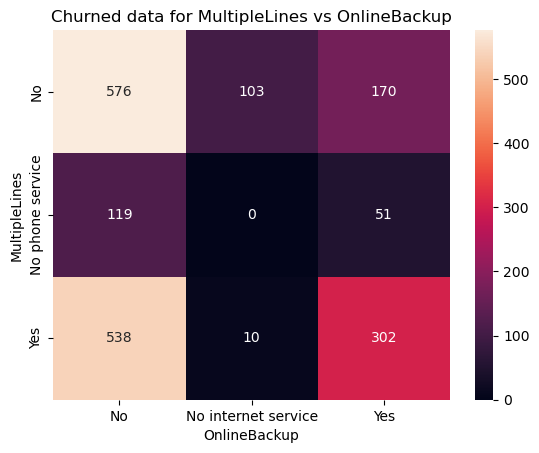

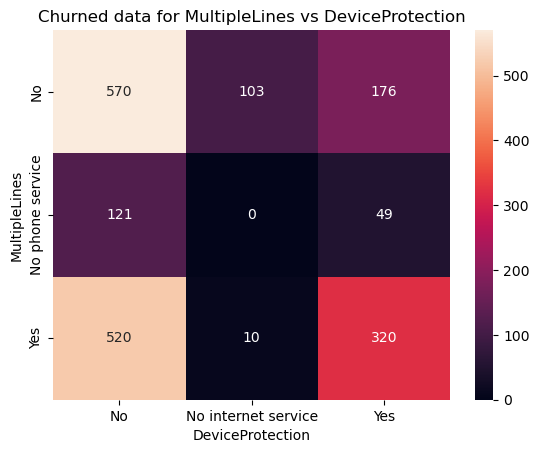

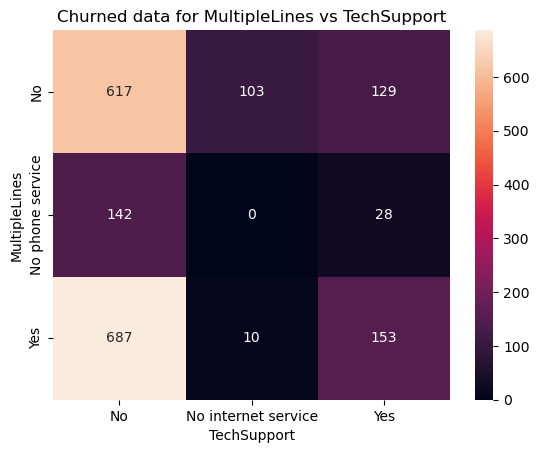

...

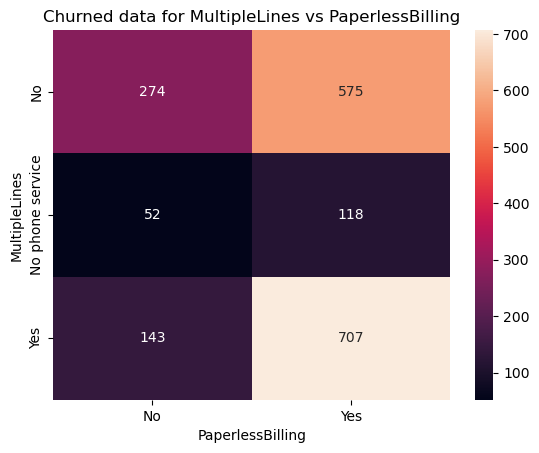

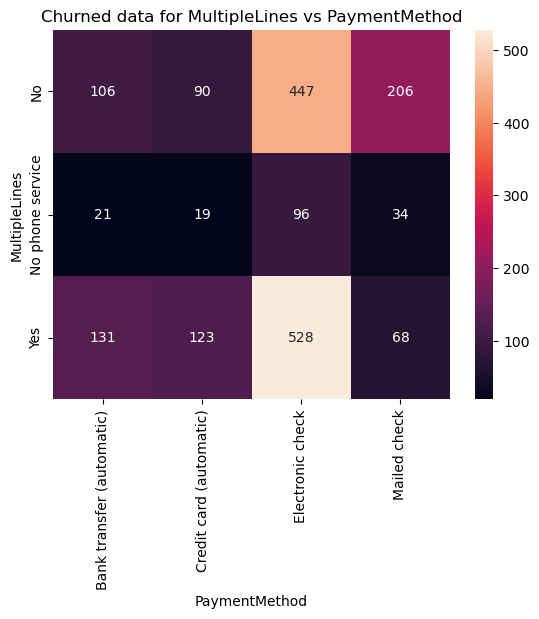

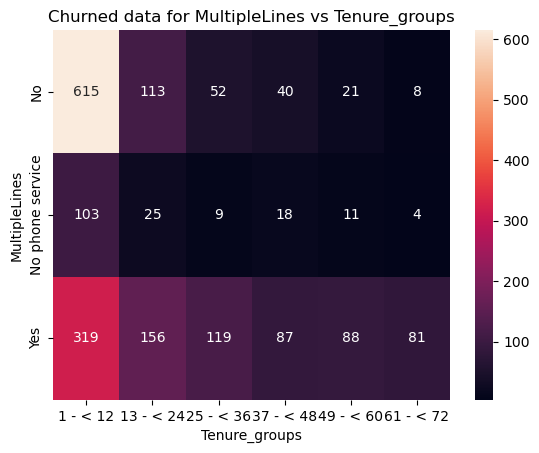

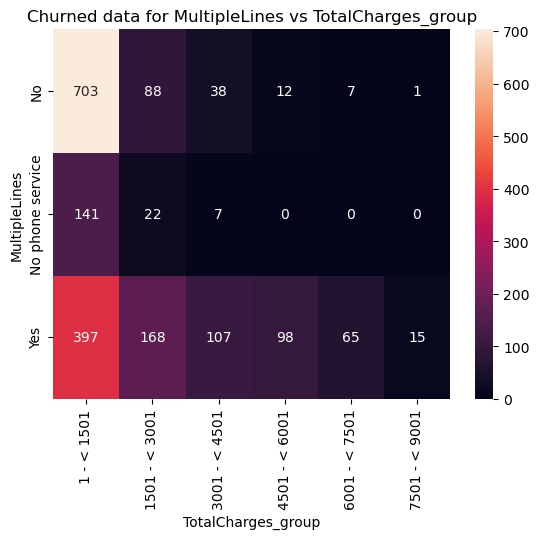

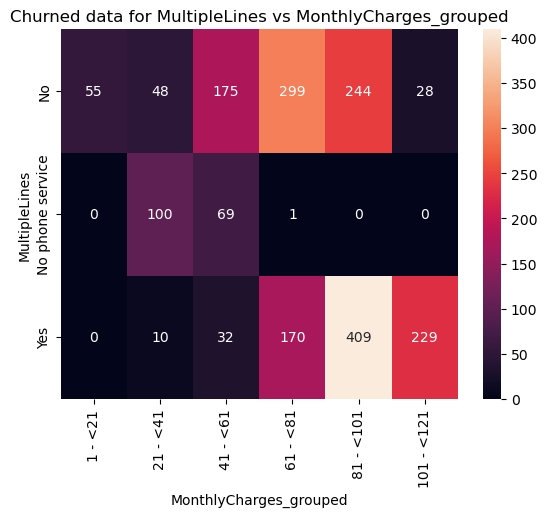

>>>>>>>>>>>>>>> InternetService vs other categorical Variables


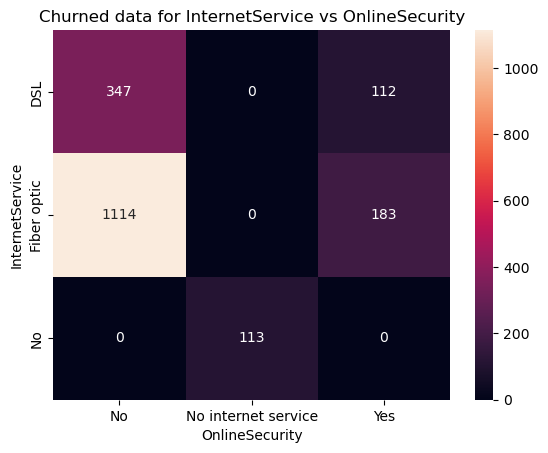

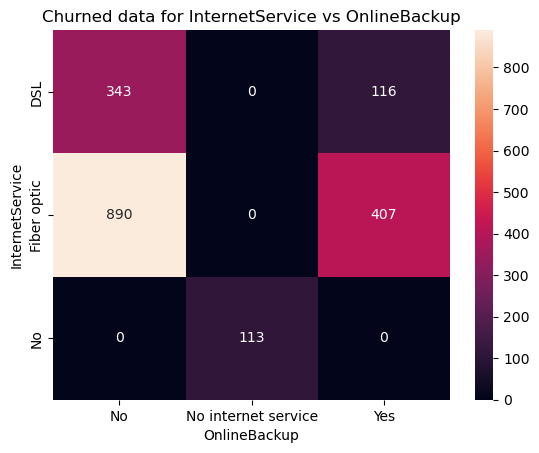

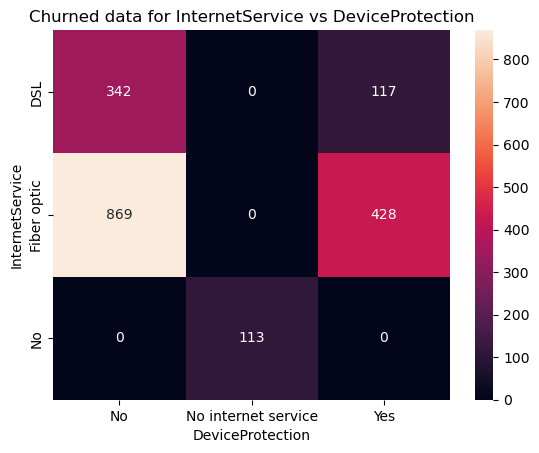

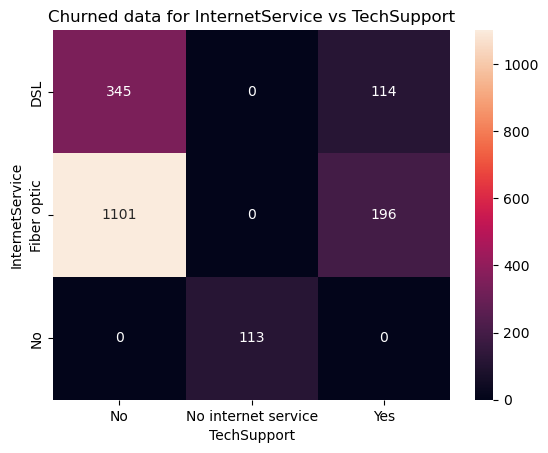

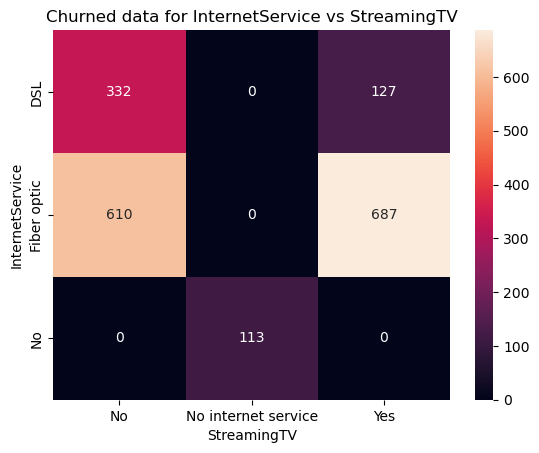

...

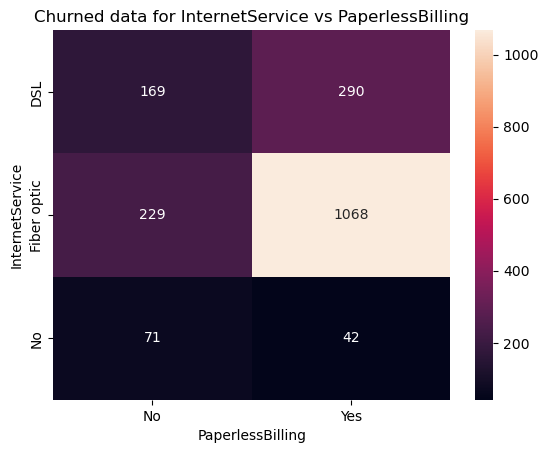

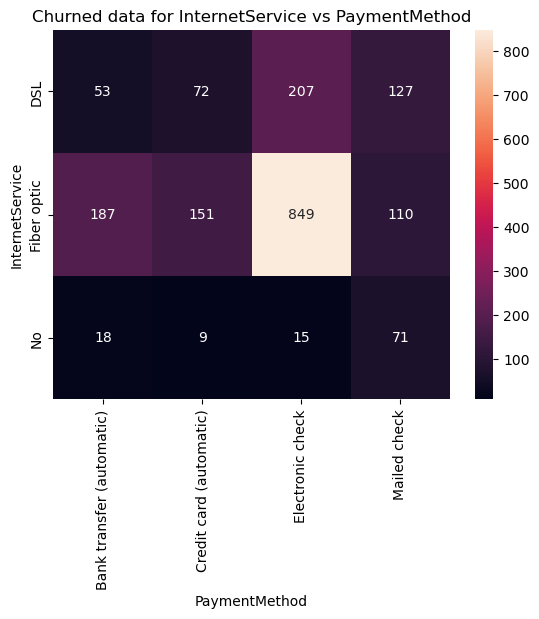

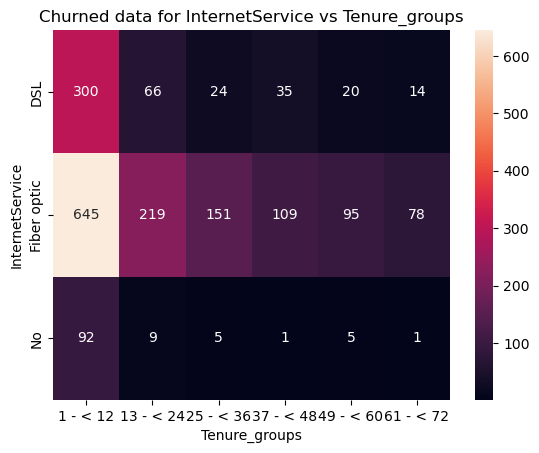

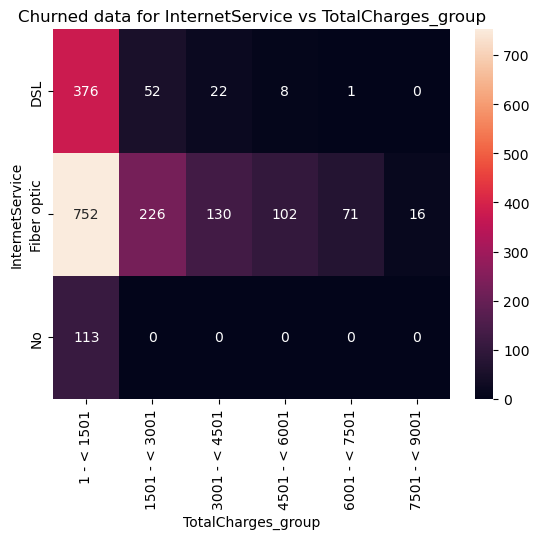

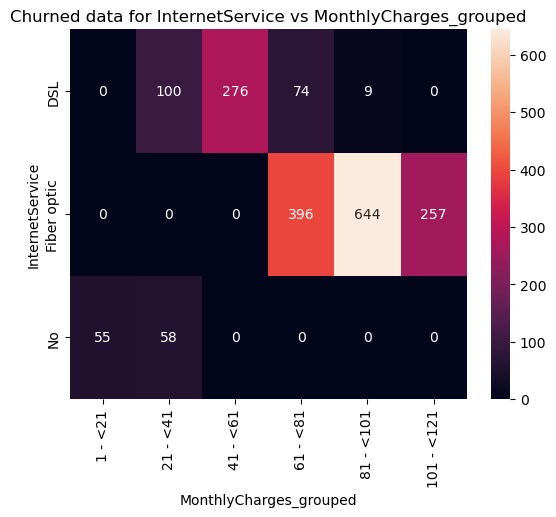

>>>>>>>>>>>>>>> OnlineSecurity vs other categorical Variables


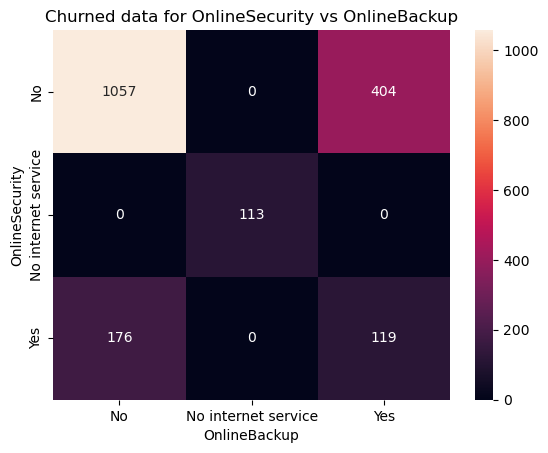

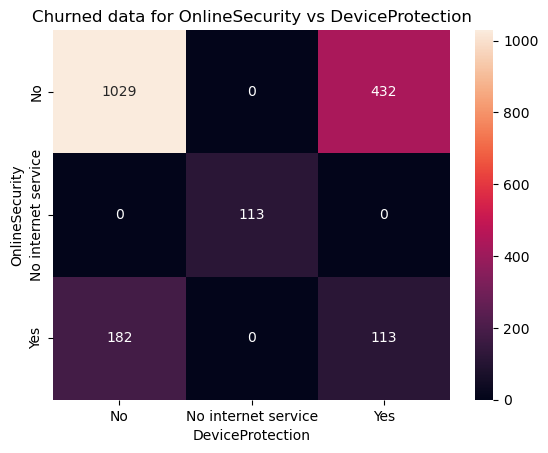

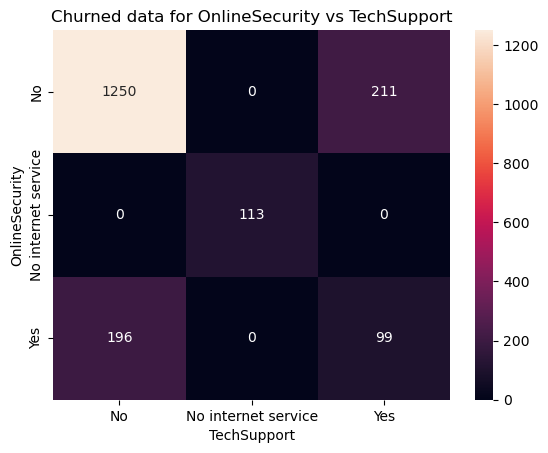

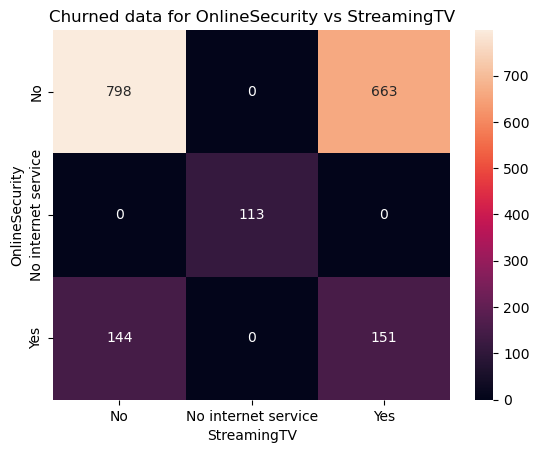

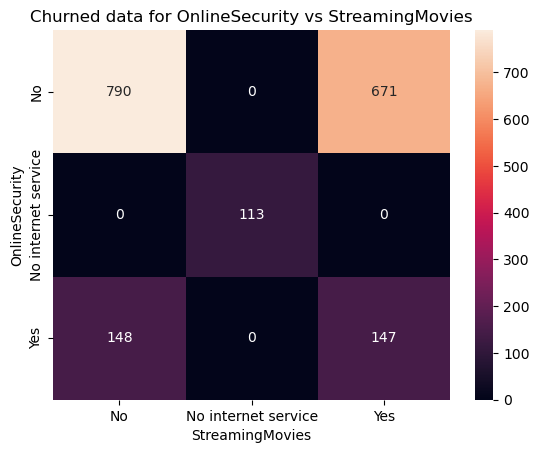

...

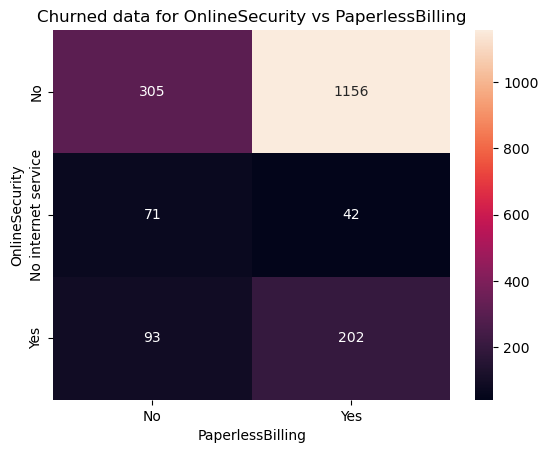

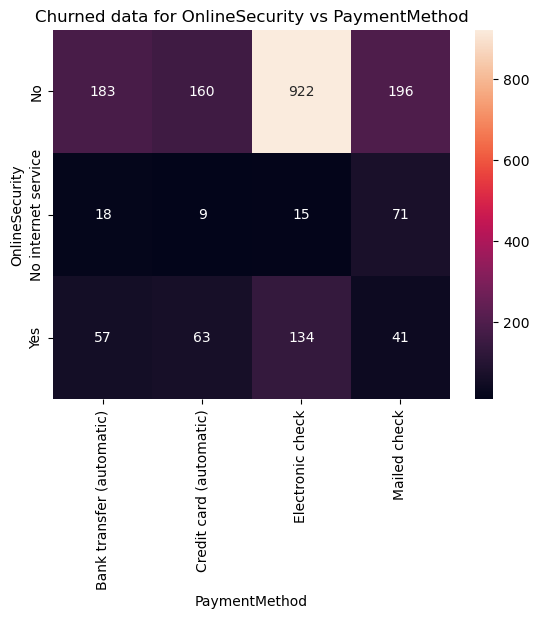

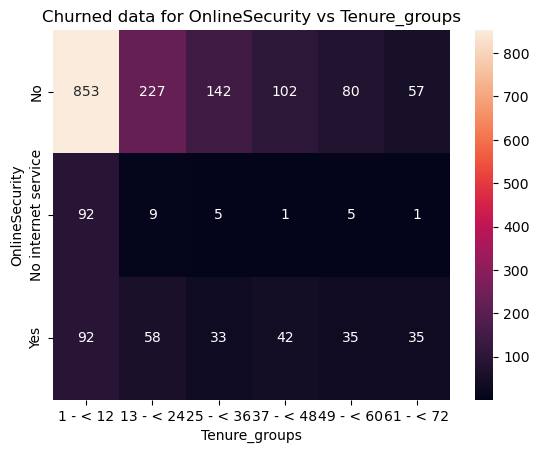

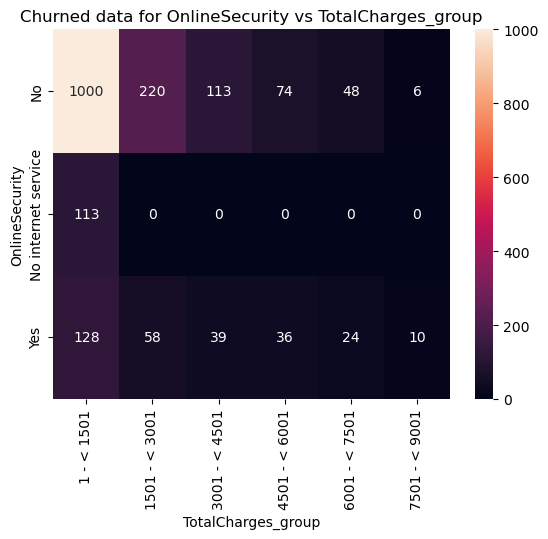

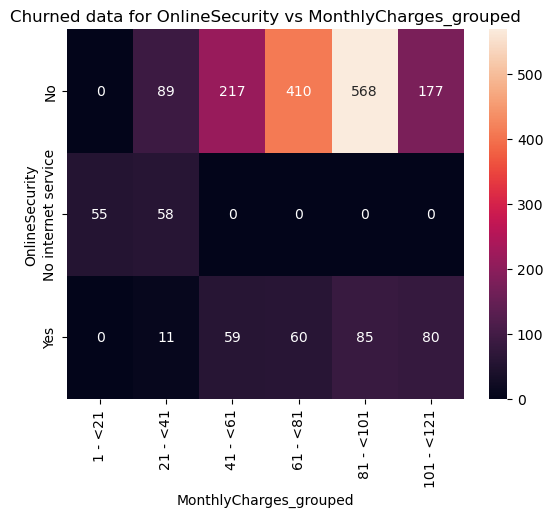

>>>>>>>>>>>>>>> OnlineBackup vs other categorical Variables


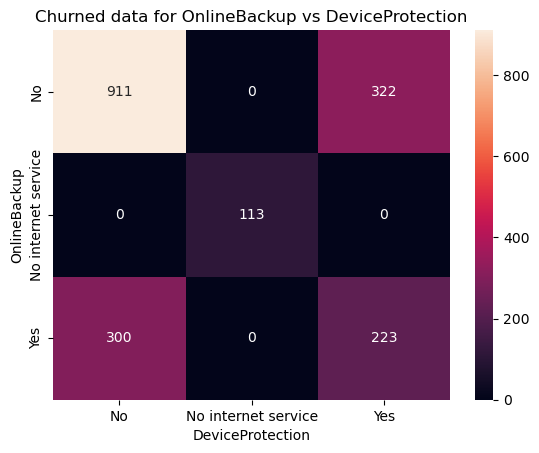

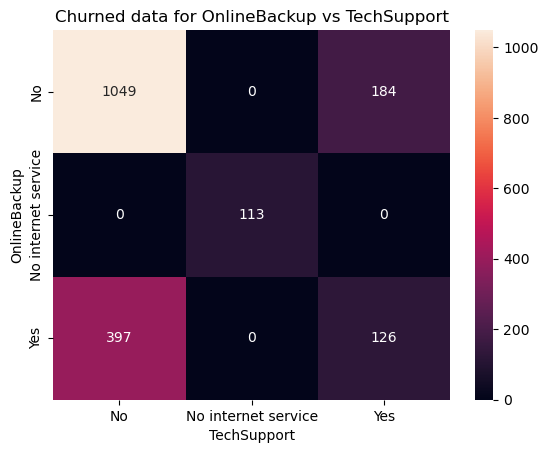

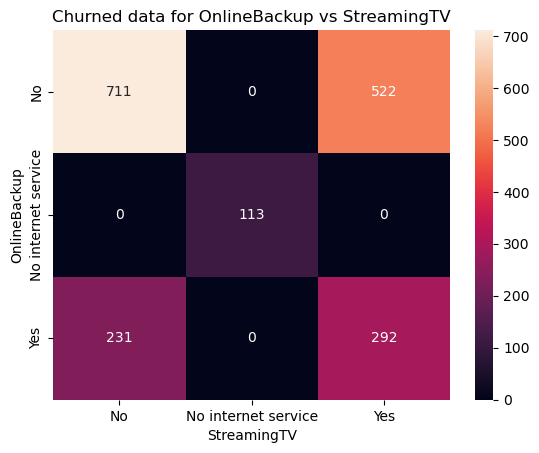

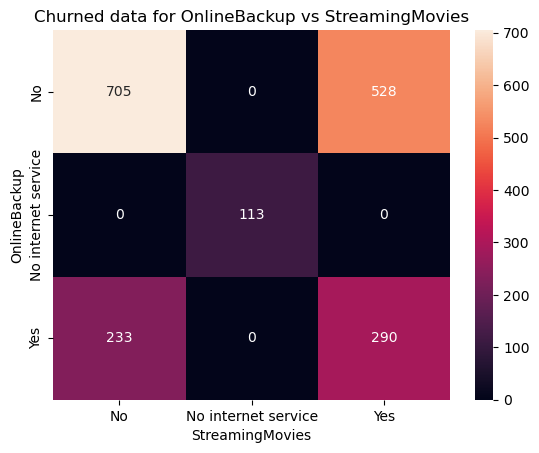

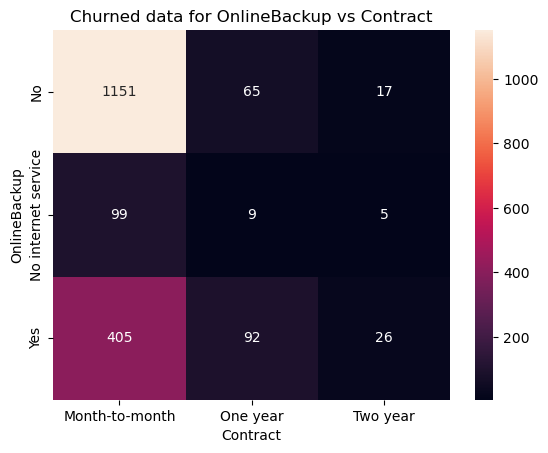

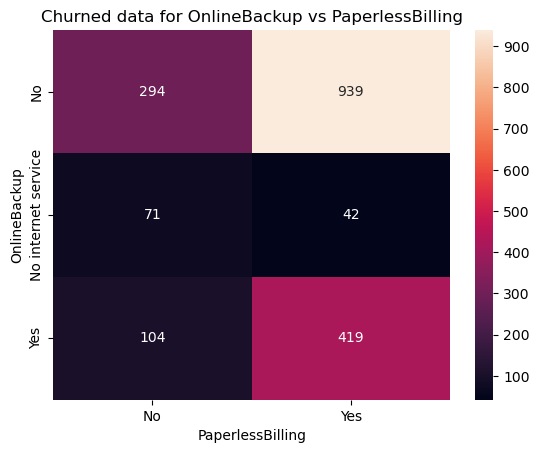

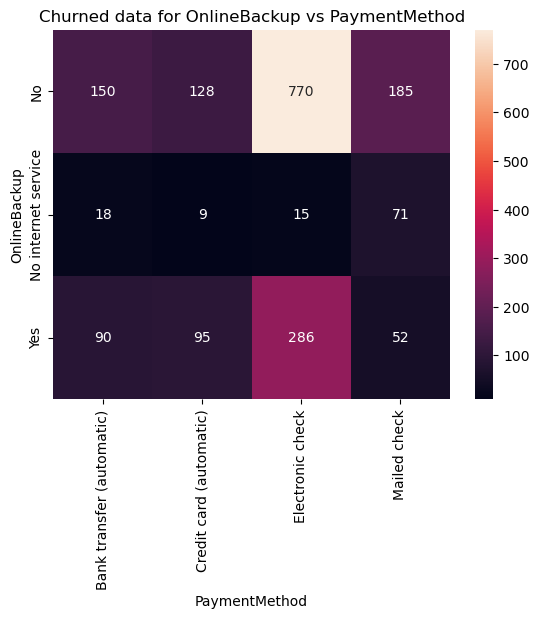

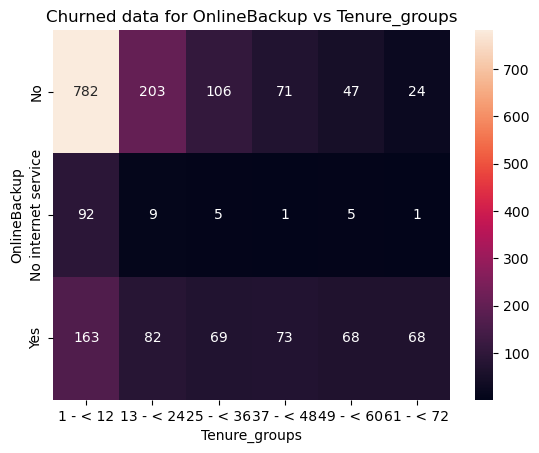

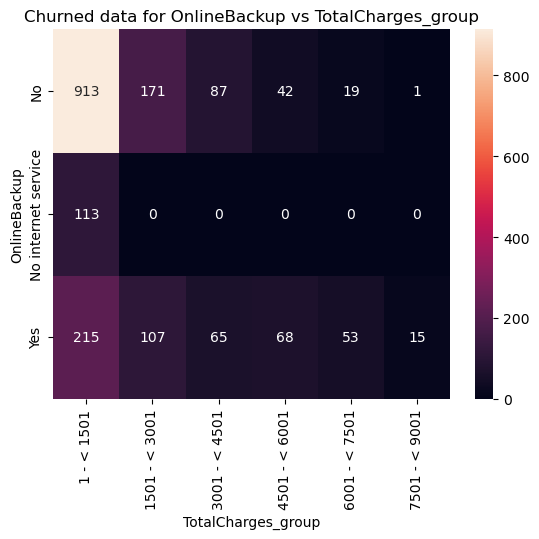

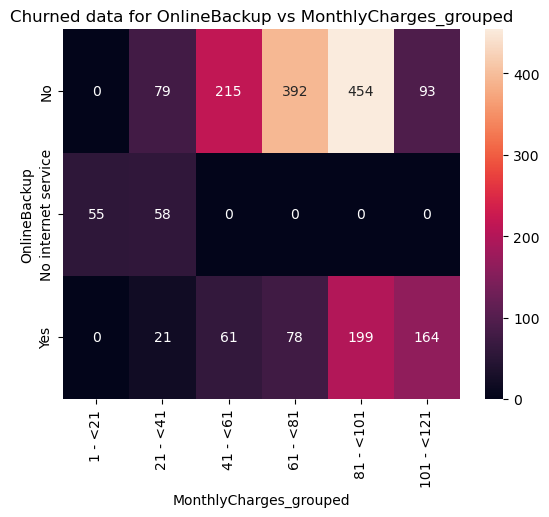

>>>>>>>>>>>>>>> DeviceProtection vs other categorical Variables


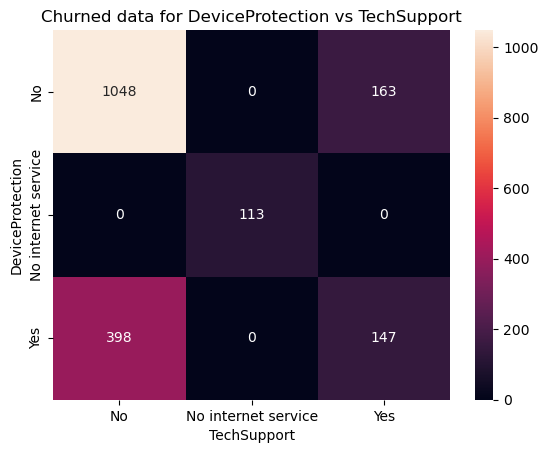

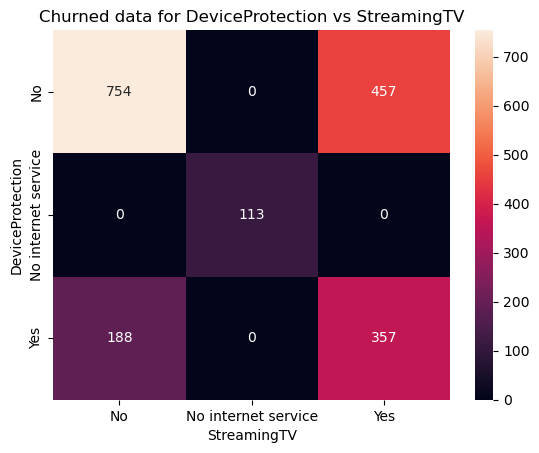

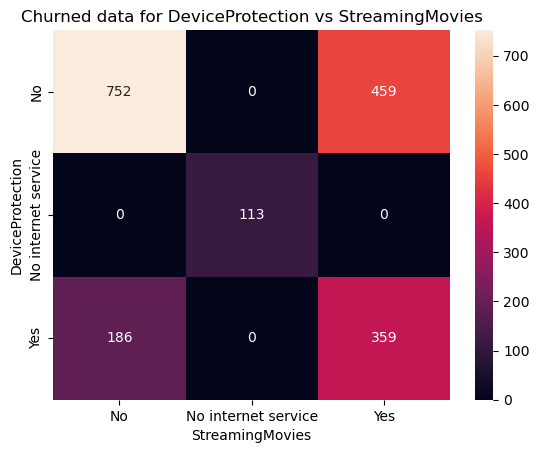

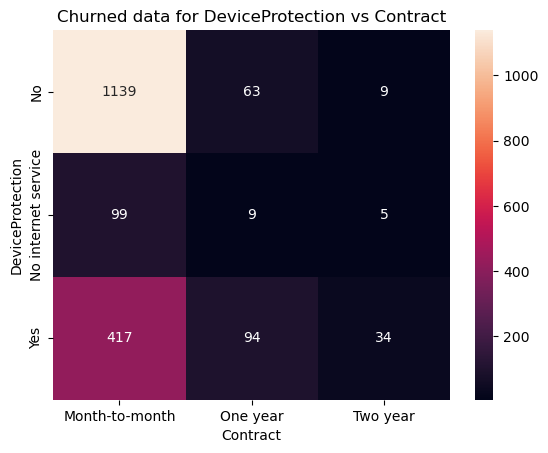

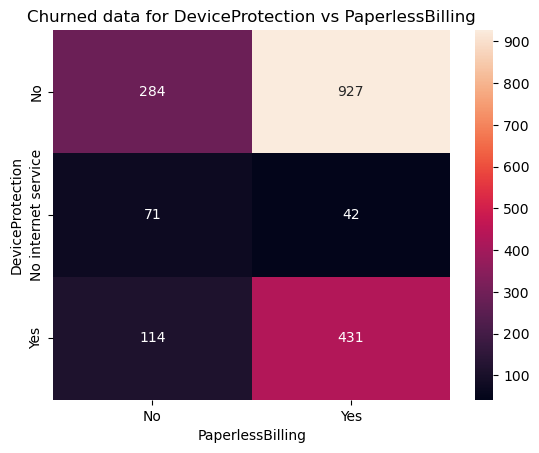

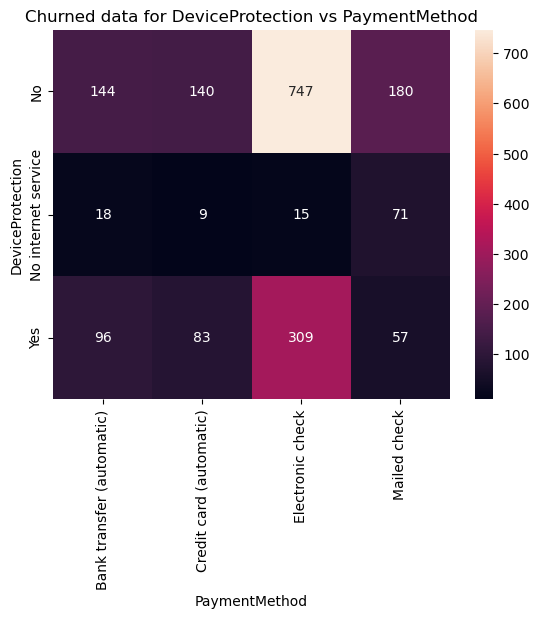

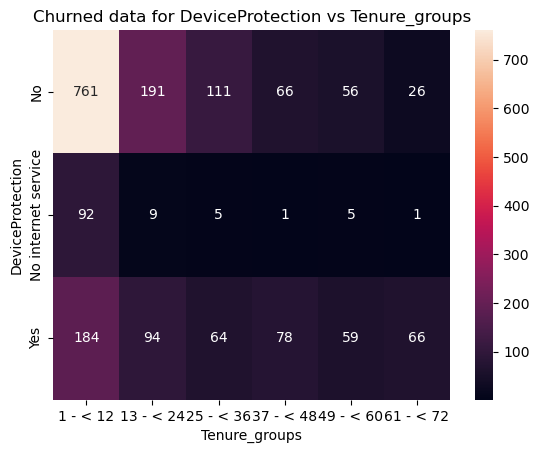

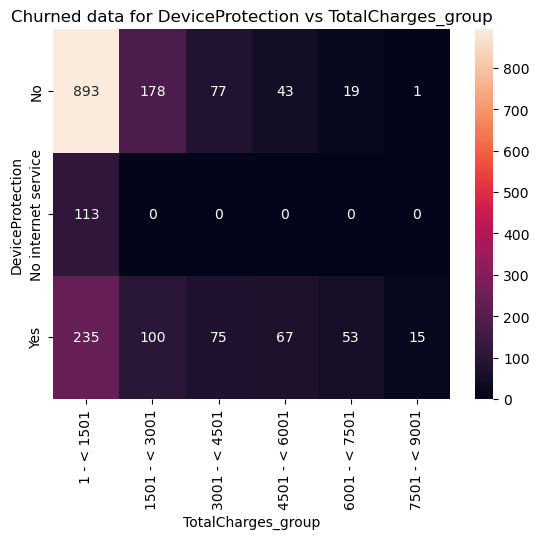

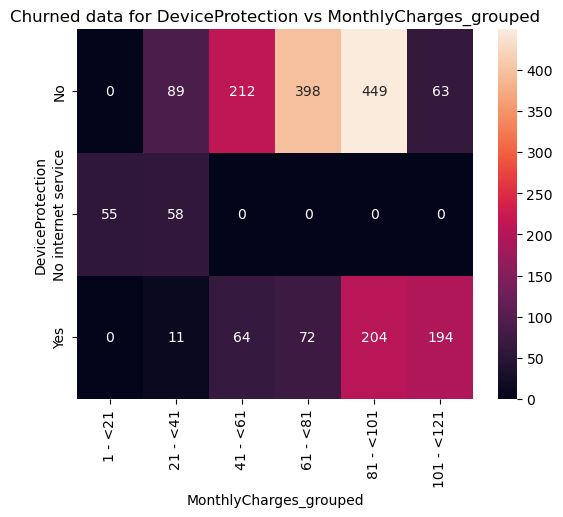

>>>>>>>>>>>>>>> TechSupport vs other categorical Variables


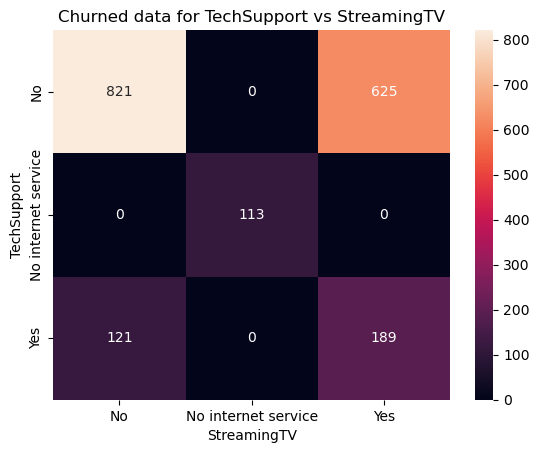

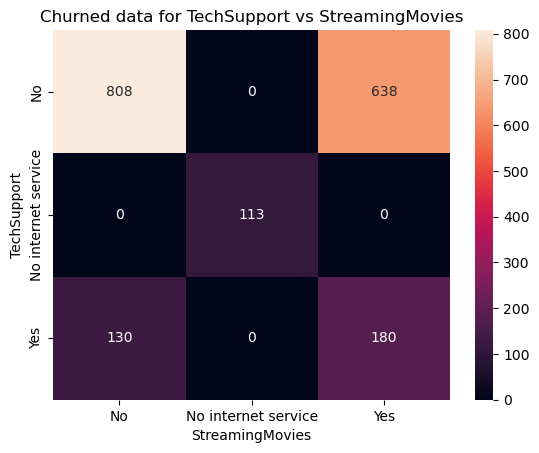

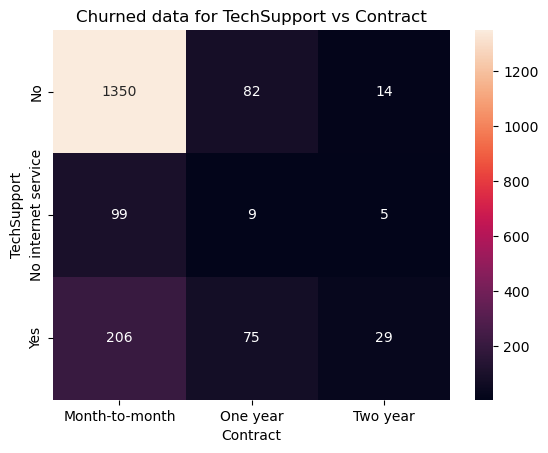

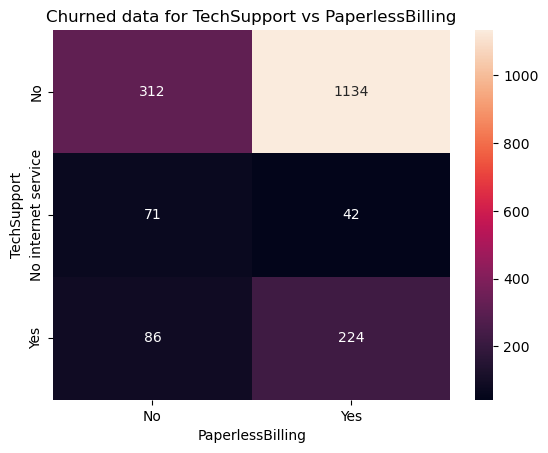

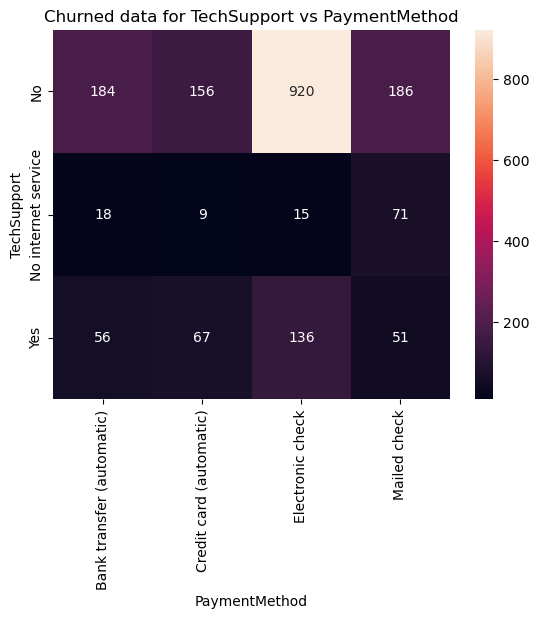

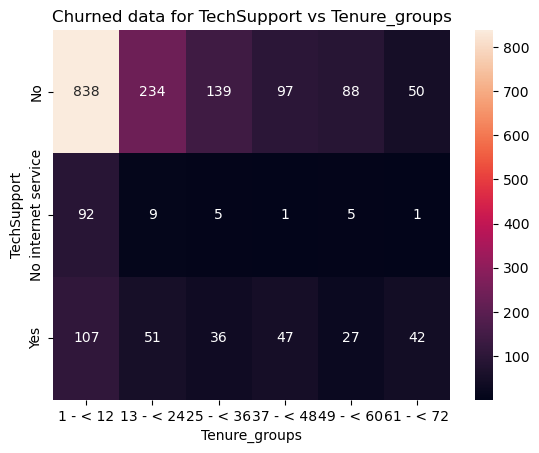

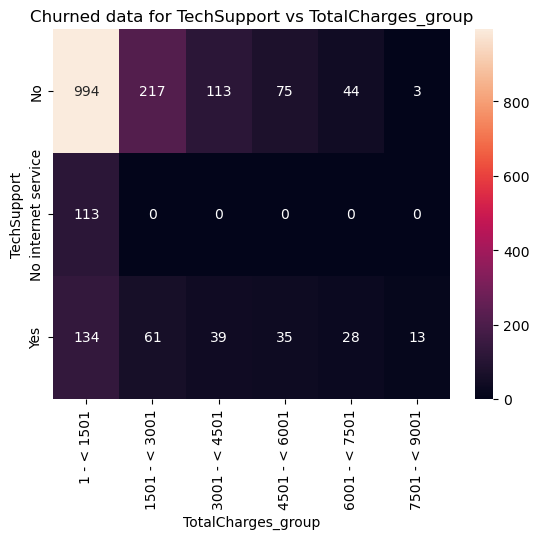

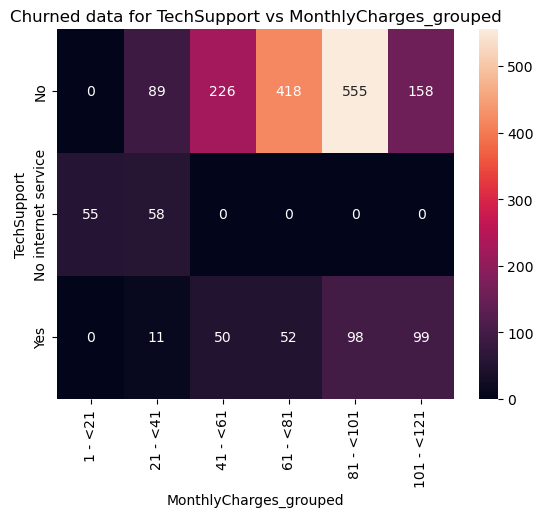

>>>>>>>>>>>>>>> StreamingTV vs other categorical Variables


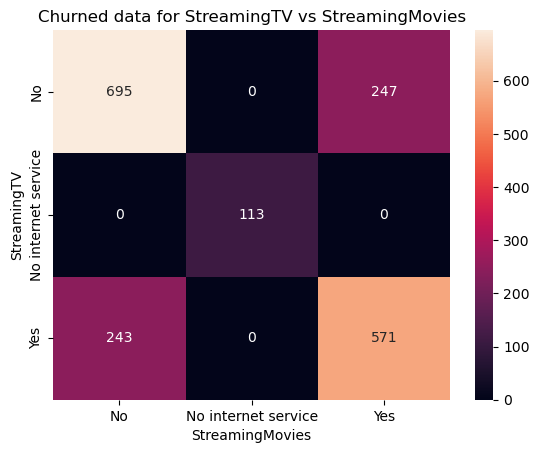

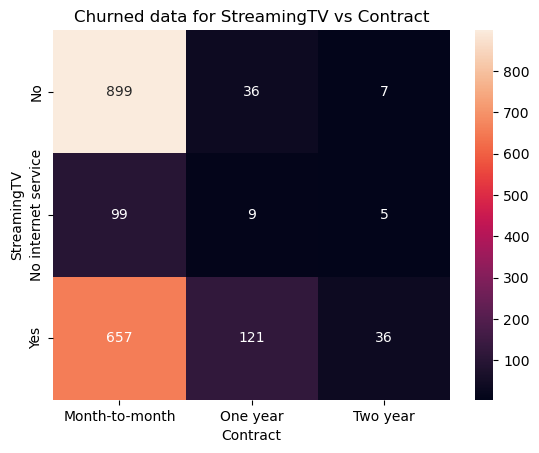

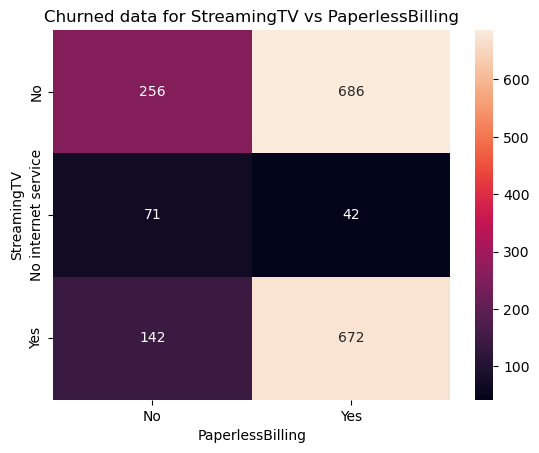

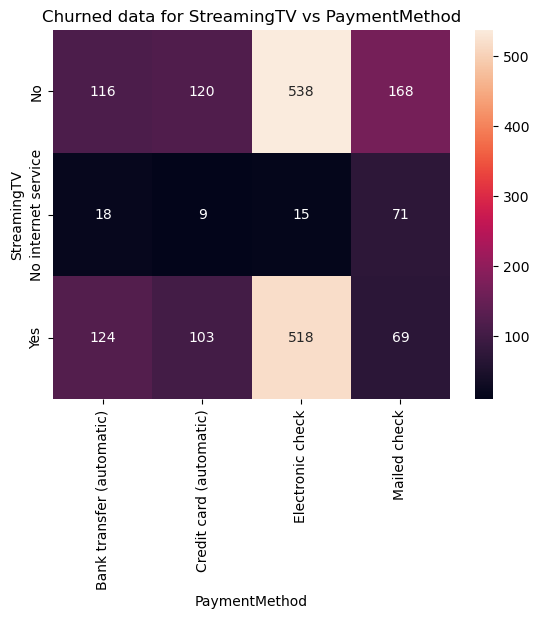

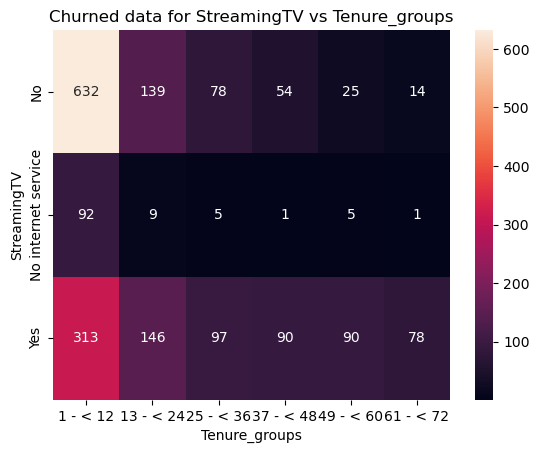

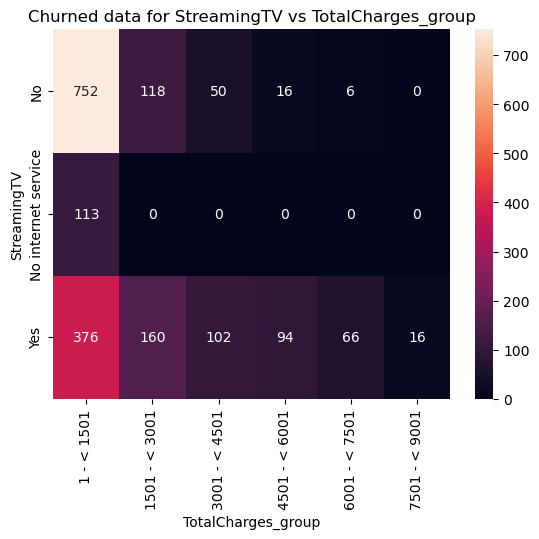

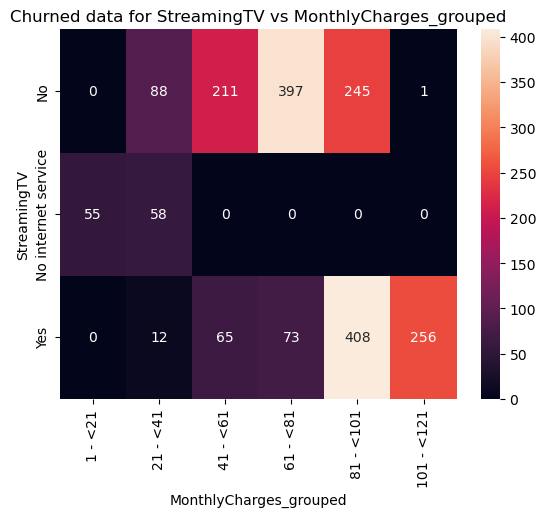

>>>>>>>>>>>>>>> StreamingMovies vs other categorical Variables


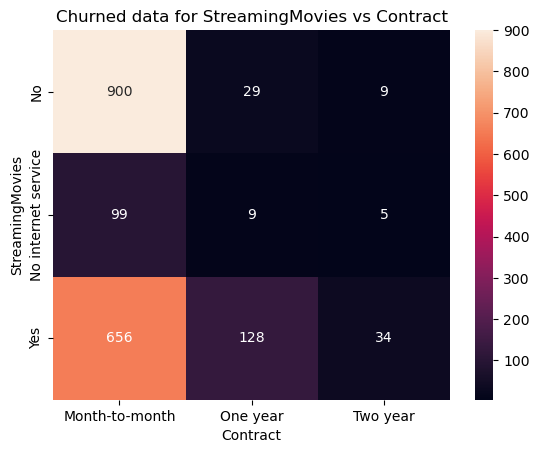

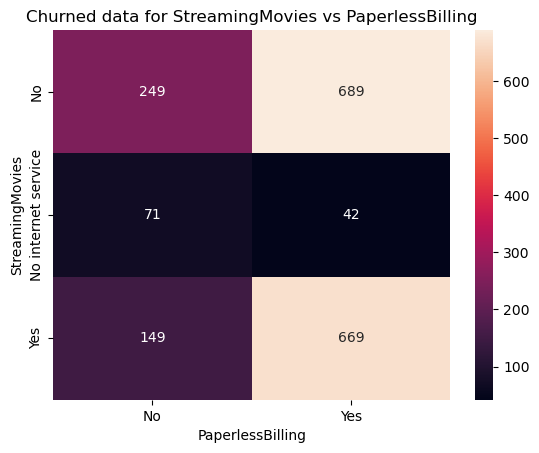

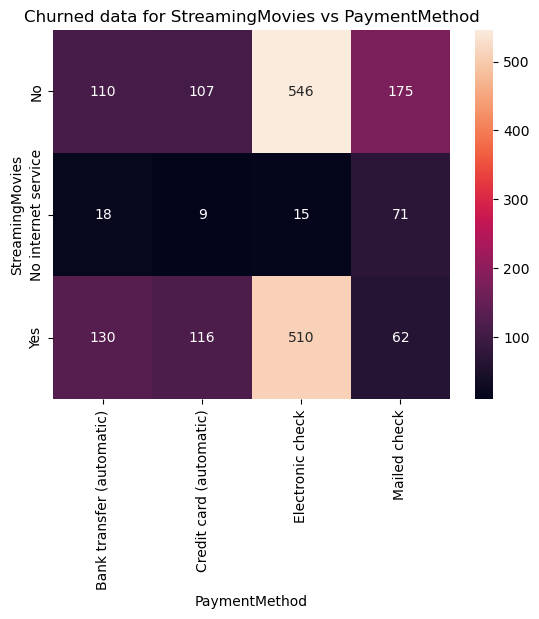

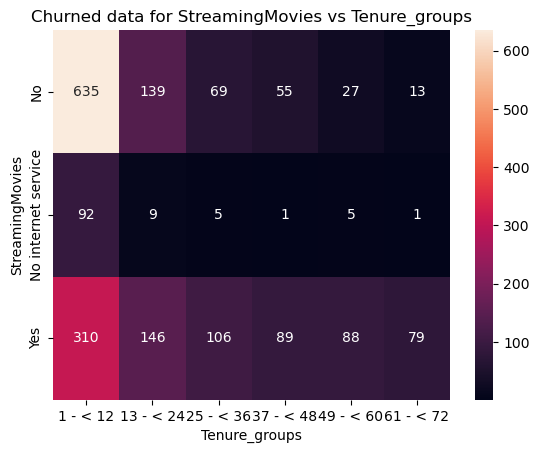

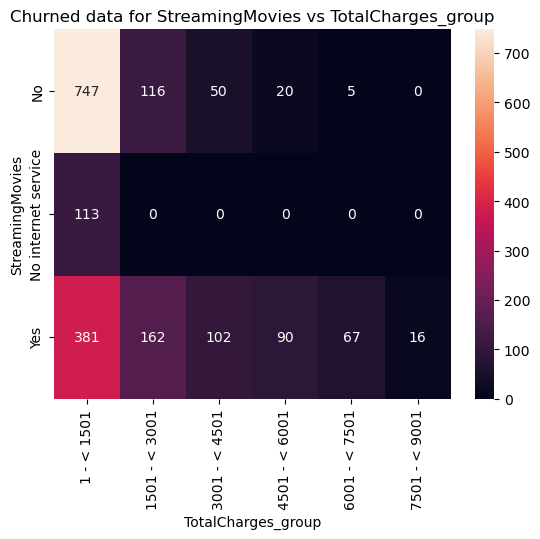

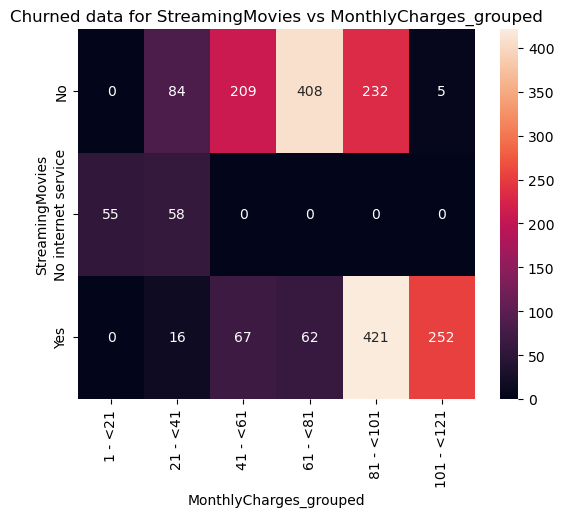

>>>>>>>>>>>>>>> Contract vs other categorical Variables


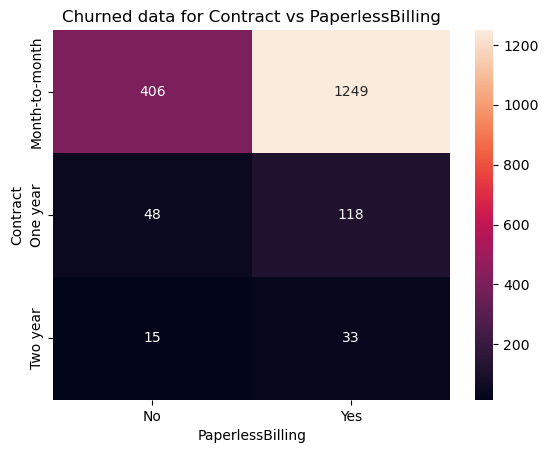

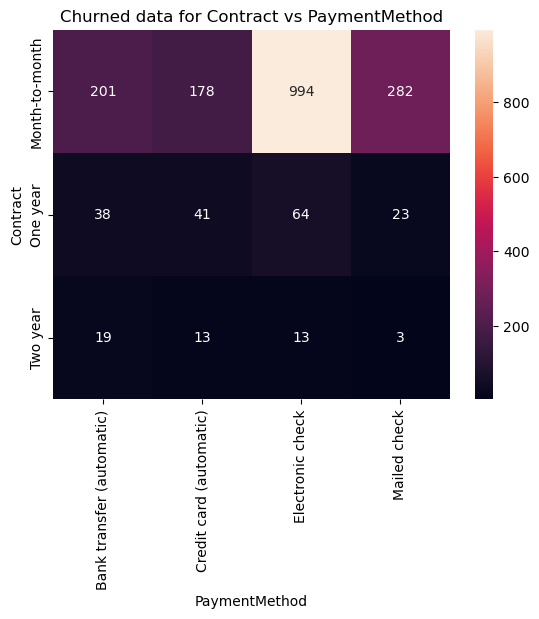

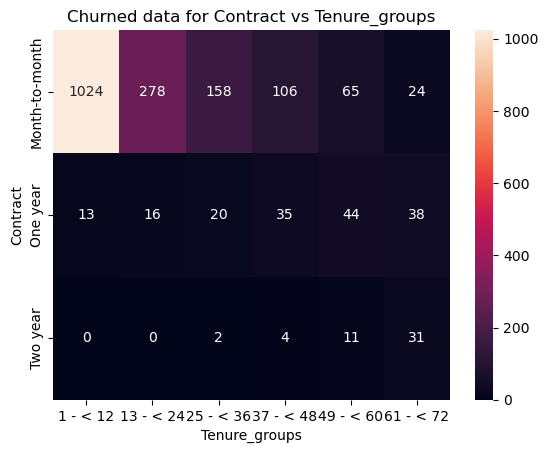

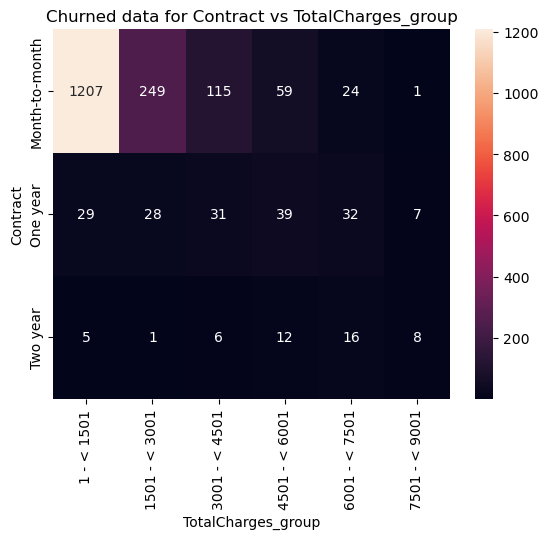

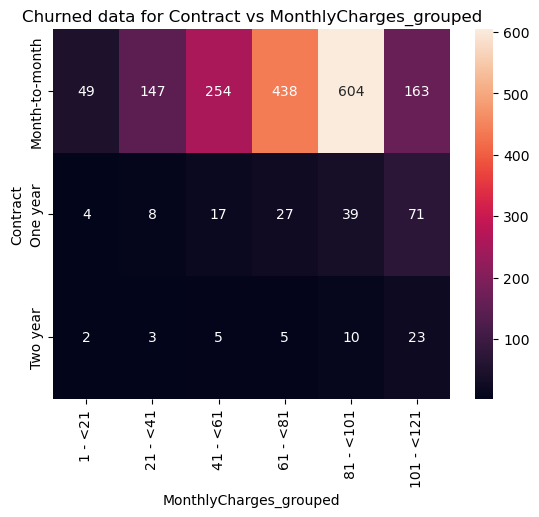

>>>>>>>>>>>>>>> PaperlessBilling vs other categorical Variables


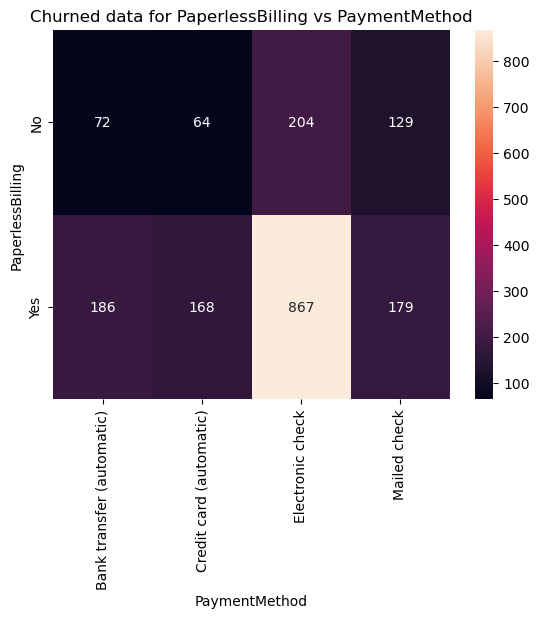

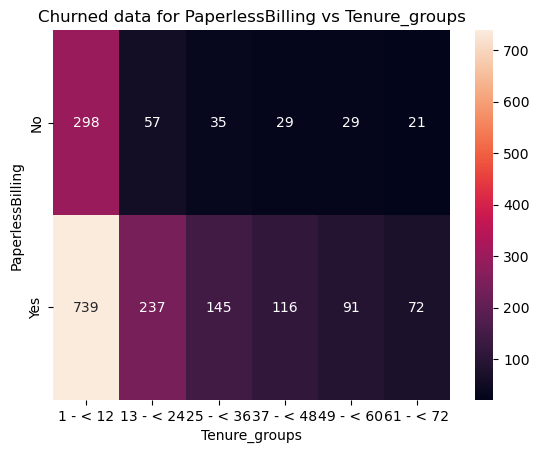

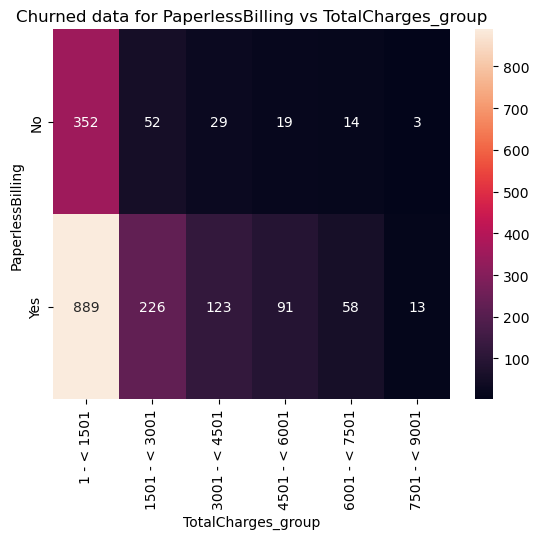

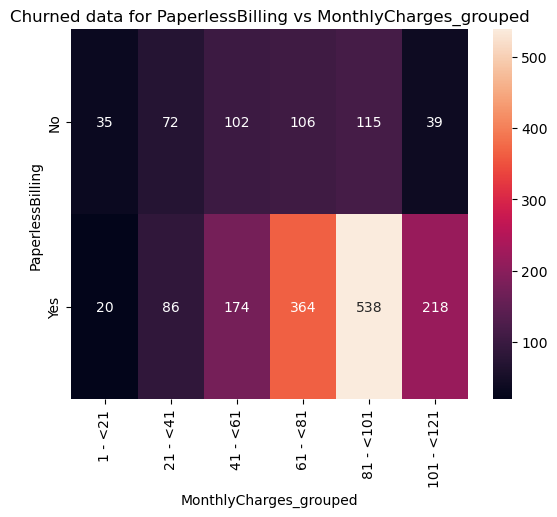

>>>>>>>>>>>>>>> PaymentMethod vs other categorical Variables


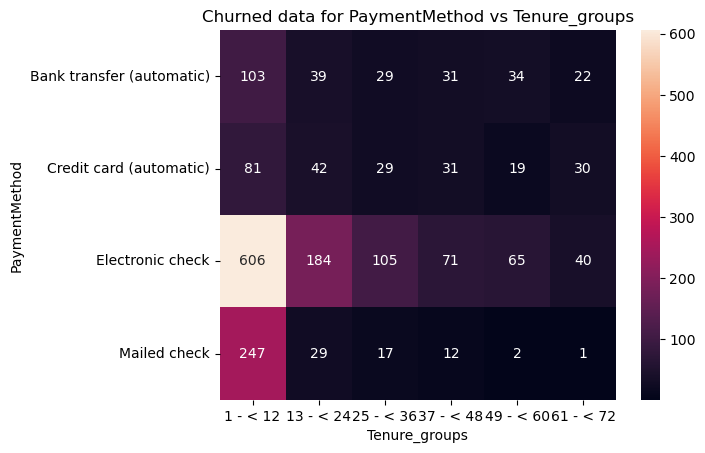

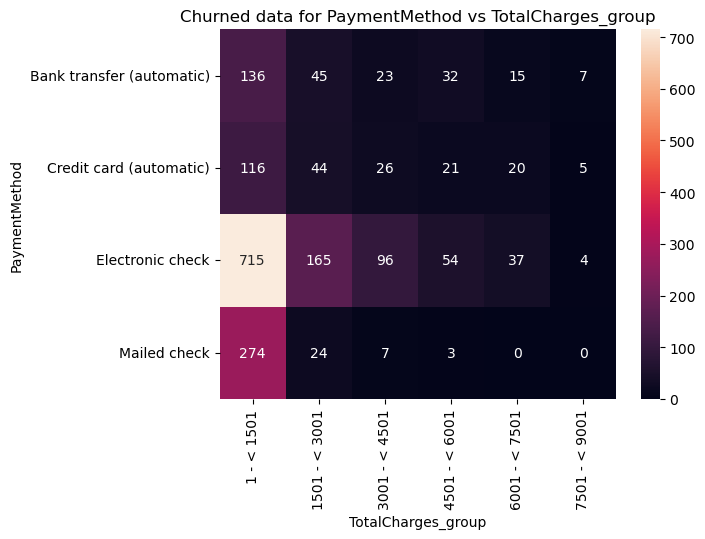

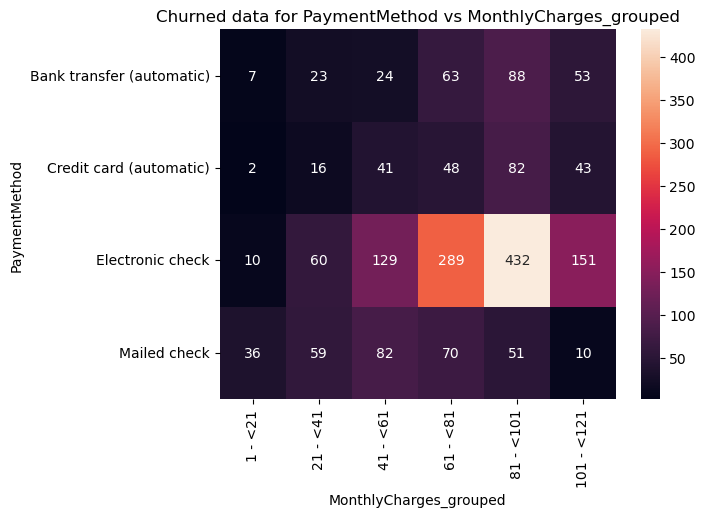

>>>>>>>>>>>>>>> Tenure_groups vs other categorical Variables


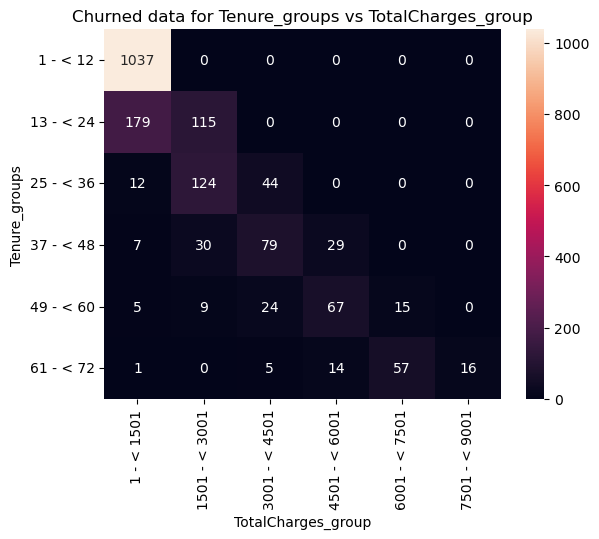

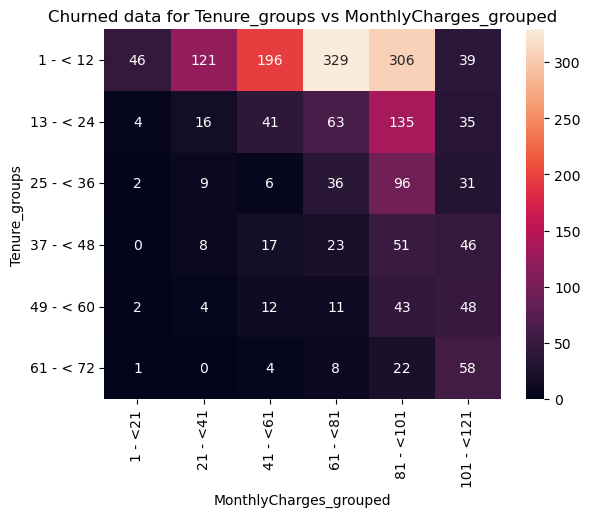

>>>>>>>>>>>>>>> TotalCharges_group vs other categorical Variables


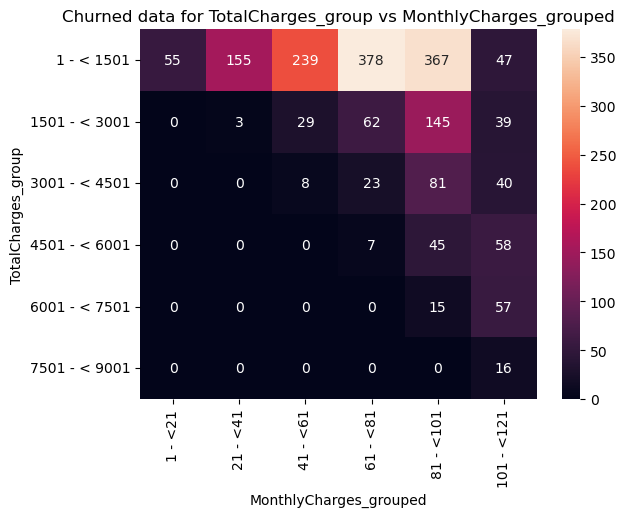

>>>>>>>>>>>>>>> MonthlyCharges_grouped vs other categorical Variables


In [60]:
heatmap_for_two_category(unique_var_list=unique_var_list,
                         data=churned_customer_df, title="Churned data for")

#### Continues variables

In [61]:
numerical_variables

['SeniorCitizen', 'tenure', 'MonthlyCharges', 'TotalCharges']

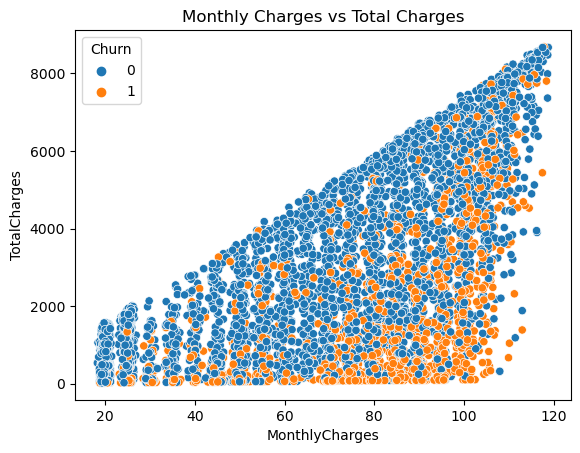

In [62]:
plt.title("Monthly Charges vs Total Charges")
sns.scatterplot(x=df["MonthlyCharges"], y=df["TotalCharges"], hue=df["Churn"])
plt.show()

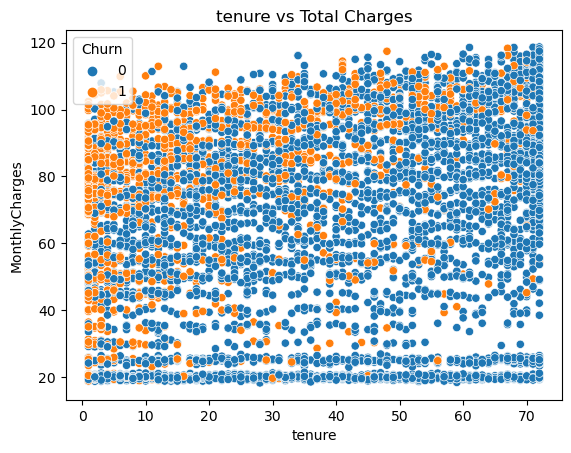

In [63]:
plt.title("tenure vs Total Charges")
sns.scatterplot(x=df["tenure"], y=df["MonthlyCharges"], hue=df["Churn"])
plt.show()

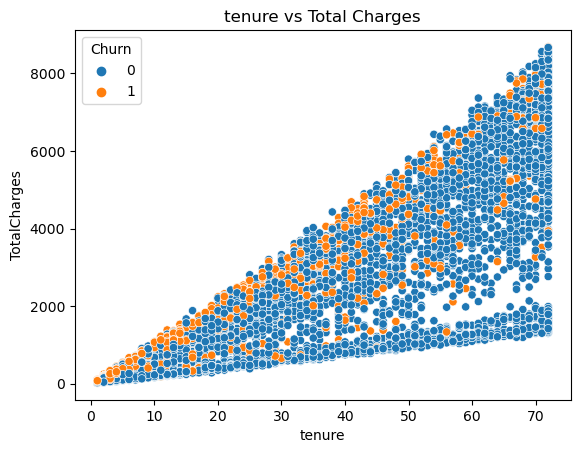

In [64]:
plt.title("tenure vs Total Charges")
sns.scatterplot(x=df["tenure"], y=df["TotalCharges"], hue=df["Churn"])
plt.show()

As we expected we can see that monthly charges and total charges increase in proportionally.Also people who have high tenure churn less even they have costly monthly plan

### Correlation plots

/tmp/ipykernel_3049/437280949.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()["Churn"].sort_values(ascending=False).plot(kind='bar')


<Axes: >

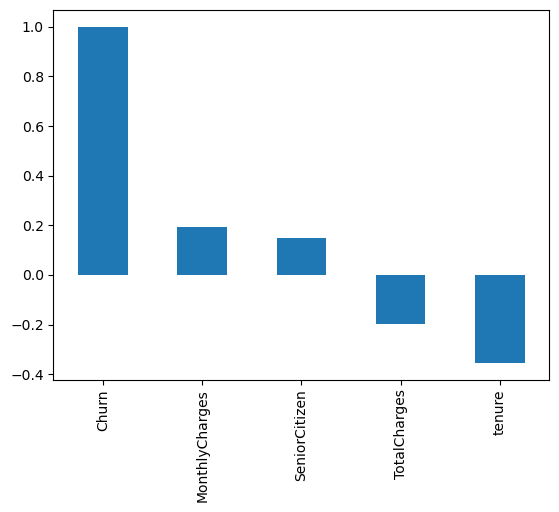

In [65]:
df.corr()["Churn"].sort_values(ascending=False).plot(kind='bar')

This plot only gives information about numerical variables. So we can create a one hot encoded data set test correlation again

<Axes: title={'center': 'Correlation With Churn'}>

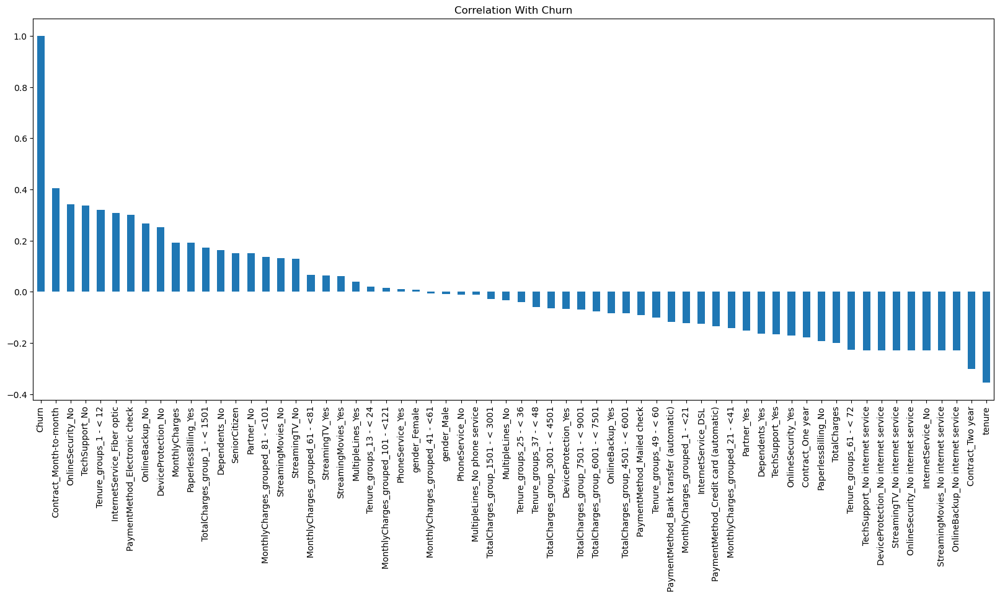

In [66]:
plt.figure(figsize=(20, 8))
plt.title("Correlation With Churn")
df_dummies_no_dropped.corr()["Churn"].sort_values(
    ascending=False).plot(kind="bar")

<Axes: title={'center': 'Correlation Map'}>

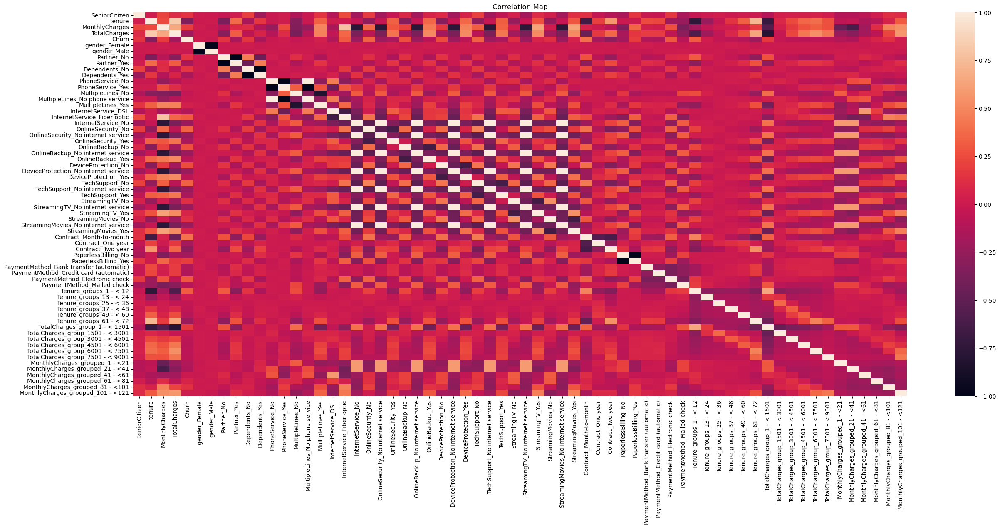

In [67]:
plt.figure(figsize=(30, 12))
plt.title("Correlation Map")
sns.heatmap(df_dummies_no_dropped.corr())

In [68]:
# dumping the one hot encoded data without reducing columns
df_dummies_no_dropped.to_csv("df_dummies_no_dropped.csv")